# Hoja de ruta

Este código está compuesto de las siguientes partes:

1.  Importación de librerías
2.  Definición de rutas de carga y guardado de archivos
3.  Lectura de datos 
4.  Creación de listas vacías donde se depositan posteriormente los estadísticos
5.  Creación de coordenadas de tres áreas específicas de estudio: Guajira, Pacifico y Atlántico
6.  Cálculo de los estadísticos para el mapa global, Guajira, Pácifico y Atlántico. Se calculan Media, Mediana, Desviación estándar, Kurtosis, Skewness, Percentil 25 y Percentil 75, y se da el llenado de las listas mencionadas en el paso  (4) con estos estadísticos calculados
7.  Se convierten las listas de los estadísticos del paso (6) en arrays
8.  Se crean arreglos bidimensionales de [Lat,Lon], donde se depositan para cada pixel del mapa los estadísticos anuales: Media, Mediana, Desviación estándar, rango intercuartil y Kurtosis 
9.  Se grafican en forma de mapa base los arreglos bidimensionales calculados en el paso (8)
10. Se calculan los mismos estadísticos del paso (8), pero haciendo el ciclo anual, es decir arrays tridimensionales [time,lat,lon]
11. Se grafican en forma de mapa base los arreglos tridimensionales calculados en el paso (10)
12. Se grafican en forma de figuras los estadísticos Media, Mediana, percentil 25 y percentil 75 convertidos en arrays en el paso (7) y calculados en el paso (6). Esto para los datos globales
13. Se grafican en forma de figura la Media, Mediana, Desviación estándar, Kurtosis, Skewness, Percentil 25 y 75 de las ubicaciones Guajira, Atlántico y Pacifico de los array obtenidos en el paso (7)
14. Se grafican histogramas de frecuencia de las 4 zonas de estudio (Global, Guajira, Pacifico y Atlántico)
15. Se grafican Scatterplots de Guajira vs Pacifico, Guajira vs Atlantico y Pacifico vs Atlántico
16. Se grafican histogramas bivariados de Guajira vs Pacifico, Guajira vs Atlantico y Pacifico vs Atlántico 

### Objetivo general

* A parte de entender cómo leer datos climáticos en formato NetCDF, obtener estadísticos de precipitación y realizar análisis de datos (redactar texto), el objetivo también busca que el estudiante mejore este código, optimizandolo, por ejemplo con el uso de funciones cuando se tengan bloques de código redundantes o inclusive minimizar el hard coding entre otros.

* También dentro del notebook se busca que el estudiante responda preguntas concretas acerca del código de modo que comprenda los pormenores de este

* Una vez el estudiante logre entender el código estará en capacidad de realizar estimación de estadísticos para otros datos con Python. La idea es precisamente que el estudiante aplique los conocimientos aprendidos aquí para abordar otros datos ambientales


### Descarga de datos

Los datos los descargas de este link:

https://drive.google.com/file/d/15ZIUnLTNGUubuNP96qAVOubm0DaiHXzH/view?usp=share_link

### Acerca de los datos

The Global Precipitation Climatology Project (GPCP)

* El producto GPCP Monthly proporciona un análisis coherente de la precipitación mundial a partir de la integración de varios conjuntos de datos **satelitales sobre la tierra y el océano y de un análisis de los pluviómetros sobre la tierra**. 
* Los datos de las estaciones pluviométricas, los satélites y las observaciones de sondeo se han fusionado para estimar las precipitaciones mensuales en una cuadrícula mundial de **2.5 grados desde 1979 hasta el presente**. 
* La cuidadosa combinación de las estimaciones de precipitación basadas en los satélites proporciona el análisis más completo de la precipitación disponible hasta la fecha sobre los océanos globales, y añade el detalle espacial necesario a los análisis de la precipitación sobre la tierra.

Fuente: https://psl.noaa.gov/data/gridded/data.gpcp.html

### Fuentes de interes:

https://brownmath.com/stat/shape.htm

# 1.  Importación de librerías

Lectura de librerias y una breve descripción de su utilidad en este código (ver comentarios delante de cada libreria importada)

In [1]:
#!/usr/bin/env python2
# -*- coding: utf-8 -*-
# """
# Created on Mon Sep  4 09:40:30 2017
# @author: jorge
# """
#%matplotlib inline
from netCDF4 import Dataset              #  Leer archivos NetCDF
import matplotlib.pyplot as plt          #  crear figuras
import numpy as np                       #  operaciones artitméticas, creación de arreglos etc
from mpl_toolkits.basemap import Basemap #  Crear mapas
import datetime                          #  Trabajar con fechas
import scipy.stats                       #  calcula estadísticos como correlaciones entre otros
# import scipy.stats.stats as st         #  calcula estadísticos como correlaciones entre otros
from scipy.stats import iqr              #  calcula el rango intercuartil (Interquartile Range (IQR))

# 2. Rutas de archivos

Se definen las rutas de los archivos de entrada y salida del código

In [2]:
ruta_netcdfs    =  "/Users/jaech/Mi_unidad/CURSOS/ANALISIS_DE_DATOS/MODULO_2/Datos/datos_estadisticosppt/netcdfs/"   # Directorio carpeta de archivos de precipitacion global
ruta_figuras    =  "/Users/jaech/Mi_unidad/CURSOS/ANALISIS_DE_DATOS/MODULO_2/Datos/datos_estadisticosppt/figuras/"   # Directorio donde se almacenan las figuras generadas en este código

# 3. Lectura de datos

* Se lee el archivo NetCDF que contiene los datos climáticos de precipitación. 
* Se definen las variables con el nombre que contiene la metadata del archivo NetCDF. 
* Es importante imprimir (print (archivoprecipitacion.variables)) las variables del NetCDF para poderlas definir llamándolas con su nombre específico.

In [3]:
import xarray as xr 
archivoprecipitacion = xr.open_dataset(ruta_netcdfs + "precip.mon.mean.nc")
archivoprecipitacion.variables

Frozen({'lat': <xarray.IndexVariable 'lat' (lat: 72)>
array([-88.75, -86.25, -83.75, -81.25, -78.75, -76.25, -73.75, -71.25, -68.75,
       -66.25, -63.75, -61.25, -58.75, -56.25, -53.75, -51.25, -48.75, -46.25,
       -43.75, -41.25, -38.75, -36.25, -33.75, -31.25, -28.75, -26.25, -23.75,
       -21.25, -18.75, -16.25, -13.75, -11.25,  -8.75,  -6.25,  -3.75,  -1.25,
         1.25,   3.75,   6.25,   8.75,  11.25,  13.75,  16.25,  18.75,  21.25,
        23.75,  26.25,  28.75,  31.25,  33.75,  36.25,  38.75,  41.25,  43.75,
        46.25,  48.75,  51.25,  53.75,  56.25,  58.75,  61.25,  63.75,  66.25,
        68.75,  71.25,  73.75,  76.25,  78.75,  81.25,  83.75,  86.25,  88.75],
      dtype=float32)
Attributes:
    units:          degrees_north
    actual_range:   [ 88.75 -88.75]
    long_name:      Latitude
    standard_name:  latitude
    axis:           Y, 'lon': <xarray.IndexVariable 'lon' (lon: 144)>
array([  1.25,   3.75,   6.25,   8.75,  11.25,  13.75,  16.25,  18.75,  21.25,
   

In [4]:
archivoprecipitacion=Dataset(ruta_netcdfs + "precip.mon.mean.nc",'r')
print (archivoprecipitacion.variables)

{'lat': <class 'netCDF4._netCDF4.Variable'>
float32 lat(lat)
    units: degrees_north
    actual_range: [ 88.75 -88.75]
    long_name: Latitude
    standard_name: latitude
    axis: Y
unlimited dimensions: 
current shape = (72,)
filling on, default _FillValue of 9.969209968386869e+36 used, 'lon': <class 'netCDF4._netCDF4.Variable'>
float32 lon(lon)
    units: degrees_east
    long_name: Longitude
    actual_range: [  1.25 358.75]
    standard_name: longitude
    axis: X
unlimited dimensions: 
current shape = (144,)
filling on, default _FillValue of 9.969209968386869e+36 used, 'time_bnds': <class 'netCDF4._netCDF4.Variable'>
float32 time_bnds(time, nv)
    comment: time bounds for each time value
    units: days since 1800-01-01 00:00:00 0:00
unlimited dimensions: time
current shape = (463, 2)
filling on, default _FillValue of 9.969209968386869e+36 used, 'lat_bnds': <class 'netCDF4._netCDF4.Variable'>
float32 lat_bnds(lat, nv)
    units: degrees_north
    comment: latitude values at the

In [5]:
precipitacion=np.array(archivoprecipitacion.variables['precip'][:])
print('Maximo antes de aplicar np.nan: ', precipitacion.max())
print('Minimo antes de aplicar np.nan: ', precipitacion.min())

precipitacion[precipitacion==9.969209968386869e+36]=np.nan

print('Maximo despues de aplicar np.nan: ', precipitacion.max())
print('Minimo despues de aplicar np.nan: ', precipitacion.min())

time=np.array(archivoprecipitacion.variables['time'][:]).astype(float) # En '' Nombre de las variables
lat=np.array(archivoprecipitacion.variables['lat'][:])
lon=np.array(archivoprecipitacion.variables['lon'][:])

print(len(lat))
print(len(lon))
print(len (precipitacion))
print(precipitacion.shape)
print (lat)
print (lon)

# print (archivoprecipitacion.variables)
fechas = np.array([datetime.datetime(1800,1,1) + datetime.timedelta(days = time[i]) for i in range(len(time))])
print(len(fechas))
#%%

Maximo antes de aplicar np.nan:  47.327435
Minimo antes de aplicar np.nan:  0.0
Maximo despues de aplicar np.nan:  47.327435
Minimo despues de aplicar np.nan:  0.0
72
144
463
(463, 72, 144)
[-88.75 -86.25 -83.75 -81.25 -78.75 -76.25 -73.75 -71.25 -68.75 -66.25
 -63.75 -61.25 -58.75 -56.25 -53.75 -51.25 -48.75 -46.25 -43.75 -41.25
 -38.75 -36.25 -33.75 -31.25 -28.75 -26.25 -23.75 -21.25 -18.75 -16.25
 -13.75 -11.25  -8.75  -6.25  -3.75  -1.25   1.25   3.75   6.25   8.75
  11.25  13.75  16.25  18.75  21.25  23.75  26.25  28.75  31.25  33.75
  36.25  38.75  41.25  43.75  46.25  48.75  51.25  53.75  56.25  58.75
  61.25  63.75  66.25  68.75  71.25  73.75  76.25  78.75  81.25  83.75
  86.25  88.75]
[  1.25   3.75   6.25   8.75  11.25  13.75  16.25  18.75  21.25  23.75
  26.25  28.75  31.25  33.75  36.25  38.75  41.25  43.75  46.25  48.75
  51.25  53.75  56.25  58.75  61.25  63.75  66.25  68.75  71.25  73.75
  76.25  78.75  81.25  83.75  86.25  88.75  91.25  93.75  96.25  98.75
 101.25 103.7

In [6]:
# en busca de fill values
print('Maximos')
print(precipitacion.max())
print(time.max())
print(lat .max())
print(lon .max())
print('Minimos')
print(precipitacion.min())
print(time.min())
print(lat .min())
print(lon .min())

Maximos
47.327435
79439.0
88.75
358.75
Minimos
0.0
65378.0
-88.75
1.25


In [7]:
print(time.shape)
print(type(time))
print(type(time[0]))

(463,)
<class 'numpy.ndarray'>
<class 'numpy.float64'>


In [8]:
print(precipitacion.shape)
print(precipitacion.ndim)
# print(precipitacion)
print(precipitacion[0:2,:,:])

(463, 72, 144)
3
[[[0.         0.         0.         ... 0.         0.         0.        ]
  [0.         0.         0.         ... 0.         0.         0.        ]
  [0.         0.         0.         ... 0.         0.         0.        ]
  ...
  [0.9812404  0.9320181  0.8138066  ... 0.91615057 0.811867   0.9017285 ]
  [0.7499759  0.77453935 0.67079806 ... 0.6945452  0.73984015 0.7661884 ]
  [0.6614727  0.5773457  0.617506   ... 0.5728163  0.6059005  0.70766836]]

 [[0.33657596 0.31659493 0.32447177 ... 0.2847315  0.29603544 0.3030814 ]
  [0.2571579  0.28121045 0.28316426 ... 0.25939476 0.25399455 0.27813244]
  [0.08254394 0.10533275 0.07907505 ... 0.17585263 0.19220772 0.1084968 ]
  ...
  [1.0672555  1.1468236  1.1544616  ... 1.0722239  1.092354   1.0788598 ]
  [1.0344999  1.0159414  1.0127925  ... 0.920662   1.0546967  0.98493016]
  [0.85120386 0.9196123  0.8411766  ... 0.9757969  0.8559053  0.8240325 ]]]


In [9]:
print(type(lat))
print(lat.shape)
print(lat.ndim)
print(lat)

<class 'numpy.ndarray'>
(72,)
1
[-88.75 -86.25 -83.75 -81.25 -78.75 -76.25 -73.75 -71.25 -68.75 -66.25
 -63.75 -61.25 -58.75 -56.25 -53.75 -51.25 -48.75 -46.25 -43.75 -41.25
 -38.75 -36.25 -33.75 -31.25 -28.75 -26.25 -23.75 -21.25 -18.75 -16.25
 -13.75 -11.25  -8.75  -6.25  -3.75  -1.25   1.25   3.75   6.25   8.75
  11.25  13.75  16.25  18.75  21.25  23.75  26.25  28.75  31.25  33.75
  36.25  38.75  41.25  43.75  46.25  48.75  51.25  53.75  56.25  58.75
  61.25  63.75  66.25  68.75  71.25  73.75  76.25  78.75  81.25  83.75
  86.25  88.75]


In [10]:
print(fechas)

[datetime.datetime(1979, 1, 1, 0, 0) datetime.datetime(1979, 2, 1, 0, 0)
 datetime.datetime(1979, 3, 1, 0, 0) datetime.datetime(1979, 4, 1, 0, 0)
 datetime.datetime(1979, 5, 1, 0, 0) datetime.datetime(1979, 6, 1, 0, 0)
 datetime.datetime(1979, 7, 1, 0, 0) datetime.datetime(1979, 8, 1, 0, 0)
 datetime.datetime(1979, 9, 1, 0, 0) datetime.datetime(1979, 10, 1, 0, 0)
 datetime.datetime(1979, 11, 1, 0, 0) datetime.datetime(1979, 12, 1, 0, 0)
 datetime.datetime(1980, 1, 1, 0, 0) datetime.datetime(1980, 2, 1, 0, 0)
 datetime.datetime(1980, 3, 1, 0, 0) datetime.datetime(1980, 4, 1, 0, 0)
 datetime.datetime(1980, 5, 1, 0, 0) datetime.datetime(1980, 6, 1, 0, 0)
 datetime.datetime(1980, 7, 1, 0, 0) datetime.datetime(1980, 8, 1, 0, 0)
 datetime.datetime(1980, 9, 1, 0, 0) datetime.datetime(1980, 10, 1, 0, 0)
 datetime.datetime(1980, 11, 1, 0, 0) datetime.datetime(1980, 12, 1, 0, 0)
 datetime.datetime(1981, 1, 1, 0, 0) datetime.datetime(1981, 2, 1, 0, 0)
 datetime.datetime(1981, 3, 1, 0, 0) datetime

# Precipitación

La lluvia en la zona tropical se debe principalmente a la combinación de varios factores climáticos específicos de esa región. Estos son algunos de los factores que contribuyen a las lluvias abundantes en la banda tropical:

* **Convergencia de vientos** : En la zona tropical, los vientos alisios del hemisferio norte y del hemisferio sur convergen en una franja conocida como la Zona de Convergencia Intertropical (ZCIT). Esta convergencia de vientos crea una zona de baja presión y ascendencia de aire cálido y húmedo, lo que favorece la formación de nubes y precipitación.

* **Circulación atmosférica**: La circulación atmosférica en la zona tropical, conocida como la célula de Hadley, impulsa el ascenso del aire caliente cerca del ecuador. A medida que el aire asciende, se enfría y forma nubes, lo que eventualmente resulta en lluvia.

* **Alta humedad**: La zona tropical suele tener altos niveles de humedad debido a su ubicación cerca del ecuador y la presencia de vastos cuerpos de agua, como océanos y selvas tropicales. El aire cálido y húmedo retiene más humedad, lo que favorece la formación de nubes y lluvias.

* **Efecto de las montañas**: En algunas áreas tropicales, la presencia de cadenas montañosas puede influir en los patrones de lluvia. Cuando el aire húmedo y cálido se encuentra con montañas, se ve obligado a elevarse y, a medida que asciende, se enfría y condensa, lo que resulta en una mayor precipitación en las laderas de sotavento de las montañas

# Extraer mapa de marzo 1988

### Extraer mapa marzo 1988 usando xarray y cartopy

<xarray.DataArray 'precip' ()>
array(47.32743454)
<xarray.DataArray 'precip' ()>
array(0.)


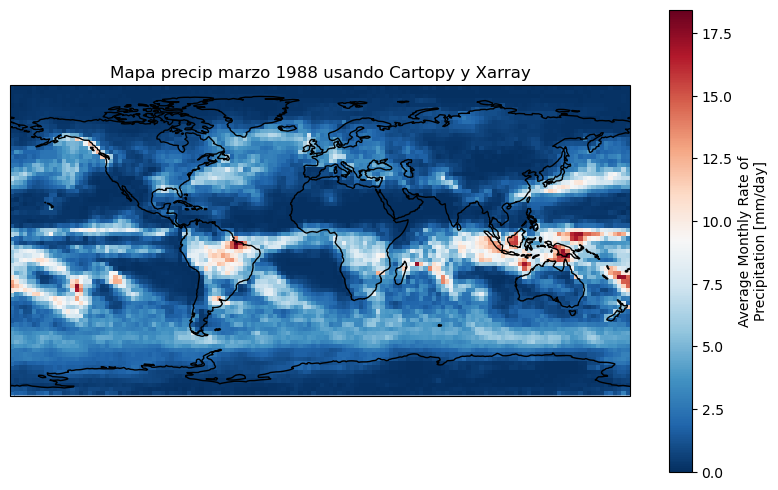

In [11]:
# Importa las librerías necesarias: datetime para manejar fechas y tiempos, xarray para trabajar con archivos netCDF, 
# cartopy para hacer mapas geográficos y matplotlib para visualizar datos.
# from datetime import datetime
import datetime
import xarray as xr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

# Abre un archivo netCDF usando xarray y lo guarda en una variable llamada "data". La ubicación del archivo se especifica 
# en una variable llamada "ruta_netcdfs".
data = xr.open_dataset(ruta_netcdfs + "precip.mon.mean.nc")
# data = xr.open_dataset(filename, decode_cf=False)

# muestra las variables disponibles en el archivo.
data.variables
var = data['precip']

# Obtiene el valor máximo y mínimo de la variable
max_val = var.max()
min_val = var.min()
print(max_val)
print(min_val)

# Crea una nueva variable llamada "data_1988", que contiene los datos para una fecha específica. En este caso, los datos de 
# "data" correspondientes a marzo de 1988 se seleccionan utilizando la función "sel" y se guardan en "data_1988". 
# La fecha se especifica utilizando la librería datetime, donde se crea un objeto datetime con el año, mes y día.
data_1988   = data.sel(time=datetime.datetime(1988, 3, 1, 0, 0))
# Extrae los datos de temperatura de la variable "data_1988" y los guarda en una nueva variable llamada "temperature".
temperature = data_1988['precip']
# Crea una figura de tamaño 10x6 pulgadas usando la función "figure" de matplotlib.
fig = plt.figure(figsize=(10, 6))
# Crea un objeto de mapa geográfico utilizando la proyección Plate Carree y lo guarda en una variable llamada "ax".
ax  = plt.axes(projection=ccrs.PlateCarree())
# Grafica los datos de temperatura utilizando la función "plot" de xarray y los colorea usando la paleta "RdBu_r". 
# También establece los valores mínimos y máximos de la escala de color. La proyección del mapa se establece utilizando el 
# argumento "transform".
temperature.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='RdBu_r',vmin = 0, vmax= temperature.max())
ax.coastlines()
plt.title('Mapa precip marzo 1988 usando Cartopy y Xarray')
plt.show()

### Extraer mapa marzo 1988 usando netcdf4 y Basemap

(72, 144)


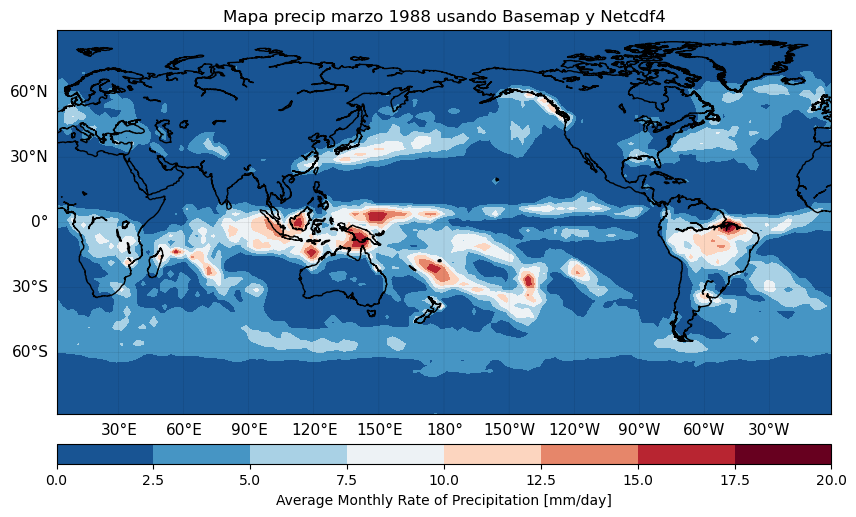

In [12]:
fechaMapa = np.where(fechas == datetime.datetime(1988, 3, 1, 0, 0))
Mapa = precipitacion[fechaMapa[0][0],:,:]
print(Mapa.shape)
plt.close('all')
fig = plt.figure(figsize=(10,8)) # Se construye la figura con sus dimensiones
ax = fig.add_subplot(111)  # Si se desea poner las figuras en subfiguras se ativa esta linea de código para organizarlas 

# Basemap es el paquete que dibuja las líneas del mapa
m  = Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat),llcrnrlon=np.min(lon),urcrnrlon=np.max(lon),rsphere=6371200.,resolution='l',area_thresh=10000)# define las coordenadas entre otras cosas del mapa

# creación de la grilla espacial
ny = lat.shape[0]; nx = lon.shape[0]# tamaño de lat y lon para construir la grilla con makegrid (nx,ny)
lons, lats = m.makegrid(nx, ny)# se crean lons y lats como arreglos bidimensionales, lons varia entre columnas [[-179. -177. -175. ...  175.  177.  179.]...[-179. -177. -175. ...  175.  177.  179.]] y lats varia entre filas [[-89. -89. -89. ... -89. -89. -89.]...[ 89.  89.  89. ...  89.  89.  89.]],
x,y = m(lons, lats) # x, y son matrices del mismo tamaño que los datos, que contienen las posiciones de los elementos en las coordenadas del mapa. x.shape == y.shape == (90, 180) ==> 'numpy.ndarray'
cs = m.contourf(x,y,Mapa,cmap='RdBu_r',vmin=0, vmax=Mapa.max()) # se asocian la grilla espacial del mapa x,y con los valores numericos de anomalias de temperatura en cada coordenada. Se le da tambien el tipo de cmap = colormap

#barra de color y lineas del mapa
m.colorbar(location='bottom',pad=0.3,label = 'Average Monthly Rate of Precipitation [mm/day]')#Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=11, linewidth=0.1)# dibuja los paralelos del mapa.  labels = [left,right,top,bottom]
m.drawmeridians(np.arange(0, 360, 30.), labels=[0,0,0,1], size=11, linewidth=0.1)# dibuja los meridianos del mapa. labels = [left,right,top,bottom]
m.drawcoastlines()# dibuja lineas costeras de los continentes
# m.drawmapboundary(fill_color='aqua')# rellena de color 'aqua' todo el mapa

plt.title('Mapa precip marzo 1988 usando Basemap y Netcdf4')# especifica el titulo y su fuente en el mapa
plt.show()

# 4. Creación de listas vacías para estadísticos

Se crean listas vacias para posteriormente llenarlas con los estadísticos Media, Mediana, desv std etc

In [13]:
# Listas vacias para análisis Global
NoNaN = []
Mean = []
Median= []
desv = []
kurt = []
Skew=[]
perc_25 = []
perc_75 = []

# Listas vacias para análisis Guajira
Media_Guajira = []
Mediana_Guajira = []
desv_Guajira=[]
kurt_Guajira=[]
Skew_Guajira=[]
perc_25_Guajira = []
perc_75_Guajira = []

# Listas vacias para análisis Pacifico
Media_Pacifico = []
Mediana_Pacifico = []
desv_Pacifico=[]
kurt_Pacifico=[]
Skew_Pacifico=[]
perc_25_Pacifico = []
perc_75_Pacifico = []

# Listas vacias para análisis Atlantico
Media_Atlantico = []
Mediana_Atlantico = []
desv_Atlantico=[]
kurt_Atlantico=[]
Skew_Atlantico=[]
perc_25_Atlantico = []
perc_75_Atlantico = []

# 5. Coordenadas Guajira, Pacifico y Atlántico

Usando la función de numpy 'where' se definen las posiciones donde se cumple que el array de lats y lons coinciden con el recuadro de las ubicaciones buscadas

In [14]:
#Las coordenadas como Guajira_Lat etc, son arreglos de numpy que contienen las posiciones donde se cumplen las condiciones como por ejemplo (lat > 10) & (lat < 14), esto entrega un arreglo que dice que las posiciones que se cumple esas dos condiciones son 40 y 41 del arreglo original de lat 
Guajira_Lat  =  np.where((lat > 10) & (lat < 14))[0] # esencialmente where ubica las posiciones dentro del array que se cumple la condición. En este caso las posiciones 40 y 41 del array lat cumplen con que lat >10 y lat <14
Guajira_Lon  =  np.where((lon >285) & (lon <290))[0] # [0] toma solamente el array que es el único elemento de la tupla
Pacifico_Lat =  np.where((lat >  2) & (lat <  8))[0]
Pacifico_Lon =  np.where((lon >275) & (lon <280))[0]
Atlantico_Lat=  np.where ((lat > 28) & (lat < 47))[0]
Atlantico_Lon=  np.where ((lon >325) & (lon <345))[0]
# type(Guajira_Lat) == numpy.ndarray


In [15]:
# Deconstrucción del código anterior
Guajira_Lat_tupla  =  np.where((lat > 10) & (lat < 14))
print('Guajira_Lat_tupla es una tupla: ', Guajira_Lat_tupla)
Guajira_Lat  =  np.where((lat > 10) & (lat < 14))[0] 
print('Guajira_Lat es un array:  ',Guajira_Lat)
print('Tipo de dato Guajira_Lat: ', type(Guajira_Lat))
print(Guajira_Lat[0])
print(Guajira_Lat[1])
print('Evaluando la posición 0 de Guajira_Lat en lat: ' , lat[Guajira_Lat[0]])
print('Evaluando la posición 1 de Guajira_Lat en lat: ' , lat[Guajira_Lat[1]])
print('')
print(lat)

Guajira_Lat_tupla es una tupla:  (array([40, 41], dtype=int64),)
Guajira_Lat es un array:   [40 41]
Tipo de dato Guajira_Lat:  <class 'numpy.ndarray'>
40
41
Evaluando la posición 0 de Guajira_Lat en lat:  11.25
Evaluando la posición 1 de Guajira_Lat en lat:  13.75

[-88.75 -86.25 -83.75 -81.25 -78.75 -76.25 -73.75 -71.25 -68.75 -66.25
 -63.75 -61.25 -58.75 -56.25 -53.75 -51.25 -48.75 -46.25 -43.75 -41.25
 -38.75 -36.25 -33.75 -31.25 -28.75 -26.25 -23.75 -21.25 -18.75 -16.25
 -13.75 -11.25  -8.75  -6.25  -3.75  -1.25   1.25   3.75   6.25   8.75
  11.25  13.75  16.25  18.75  21.25  23.75  26.25  28.75  31.25  33.75
  36.25  38.75  41.25  43.75  46.25  48.75  51.25  53.75  56.25  58.75
  61.25  63.75  66.25  68.75  71.25  73.75  76.25  78.75  81.25  83.75
  86.25  88.75]


In [16]:
print (type(Guajira_Lat))
print (Guajira_Lat.shape)
print (Guajira_Lon.shape)
print (lat.shape)
print (lon.shape)

<class 'numpy.ndarray'>
(2,)
(2,)
(72,)
(144,)


In [17]:
# np.where?

In [18]:
# Guajira_Lon
# Pacifico_Lon
# Pacifico_Lat
# Pacifico_Lat
# Atlantico_Lon
# Mapa.shape
print(Guajira_Lat)
latg = np.array([40,41])
print(lat[latg])

[40 41]
[11.25 13.75]


# 6.  Cálculo de los estadísticos para global, Guajira, Pácifico y Atlántico

### Breve explicacion de los estadísticos usados en este código (Descriptive statistics)


* **Media aritmética**: es una medida de tendencia central, surge de sumar los datos y dividirlos entre el número de datos sumados. Permite obtener un valor que en determinadas condiciones puede representar al conjunto de datos


* **Mediana**: es una medida de tendencia central, en un conjunto de datos ordenados de menor a mayor es el valor de la mitad. Si la cantidad de datos es par, esta se calcularía como el promedio de los dos valores de la mitad. La mediana es útil por su robustez, es decir no es muy sensible variar con outliers o datos engañosos.


* **Desviación estándar**: Es una medida de dispersión o variación de un conjunto de datos. La desv est. de una población de datos es la raíz cuadrada de su varianza. Su ventaja es que presenta las mismas unidades de los datos. Si la desv. est. es pequeña significa que los datos tienden a estar cerca del valor de la media y si es alta los valores están alejados de la media es decir dispersos.


* **Kurtosis**: es una medida de la forma de la distribución de probabilidad o frecuencias. Un valor grande implica un apuntalamiento de la distribución, es decir una considerable concentración de valores cercanos a la media y colas pesadas o con alta probabilidad de valores extremos. Por el contrario, una curtosis pequeña implica datos más alejados de la media. En este sentido una distribución de probabilidad puede ser leptocúrtica (curtosis grande, distribución apuntalada), mesocúrtica (curtosis intermedia, distribución entre achatada y apuntalada) y platicúrtica (valores pequeños de curtosis, distribución achatada). **La curtosis, al igual que la skewness (asimetría), no tiene unidades**: es un número puro.

* **Exceso de kurtosis** mide la diferencia entre la kurtosis de una distribución de datos y la kurtosis de una distribución normal. Si el exceso de kurtosis es **positivo**, indica que la distribución es **leptocúrtica**, lo que significa que tiene valores más cercanos a la media, pero con colas más pesadas y frecuentes valores extremos. Si el exceso de kurtosis es **negativo**, la distribución es **platicúrtica**, lo que significa que tiene valores más dispersos y alejados de la media, pero con colas más livianas y valores extremos menos frecuentes. Finalmente, si el exceso de kurtosis es **cero**, la distribución sigue una distribución **normal gaussiana** o mesocúrtica.


* **Skewness**: Estadístico que mide la simetría de una distribución de probabilidad de una variable aleatoria. El eje de simetría es una recta que pasa por la media paralela al eje y, si es cero es simétrica con respecto a la media. Si es positivo la cola es más larga a la derecha implicando valores más alejados de la media a la derecha. De manera análoga es negativo si la cola a la izquierda de la media es más alargada lo que implica valores más alejados de la media a la izquierda.

* **Percentil 25 (primer cuartil)**: Se ordenan los datos de menor a mayor y se identifica el valor que corresponde al 25% de los datos. Ejemplo los números del 1 al 100, el número 25 sería el percentil 25, dato que es el valor que corresponde con que por debajo de su valor se encuentra el 25% de los datos


* **Percentil 75 (tercer cuartil)**: de manera análoga que el percentil 25 representa el valor por debajo del cual se encuentran el 75% de los datos.


* **Percentil 50**: es el segundo cuartil y coincide con el valor de la mediana


* **Rango Intercuartil o Intercuartílico (Interquartile Range, IQR)** : Es una medida de dispersión estadística, definiéndose como un estadístico robusto. Es la diferencia entre el valor del tercer cuartil y el primer cuartil . Entre mayor sea el valor del IQR más dispersos o separados están los datos



In [19]:
for i in range(len(time)):                       # range(len(time)) == i toma valores en el rango 0,1,2,3..........,462. Esto implica que i recorre todos los meses almacenado en los datos del NetCDF
    
    #  GLOBAL
    Mapa = precipitacion[i,:,:]                  # cuando i= 0, se define la primer 'tajada del pan' == precipitacion[0,:,:], es decir los datos son un arreglo tridimensional segmentado en tajadas, cada tajada del pan es un mapa, por ejemplo i=0 corresponde al primer mapa de los datos y asi sucesivamente hasta recorrer los 463 mapas o tajadas del pan
    Mapa_NoNaN = Mapa[np.isfinite(Mapa)]         # np.isfinite(Mapa) es un arreglo de booleanos que luego es evaluado dentro de Mapa[np.isfinite(Mapa)] para seleccionar un nuevo arreglo o mapa (llamdo Mapa_NoNaN), donde se seleccionan las posiciones que son numeros finitos, es decir se evitan los NaNs y los infinitos del arreglo Mapa
    NoNaN.append(len(Mapa_NoNaN))                # almacena en la lista 'NoNaN' la cantidad de pixeles de cada tajada o mapa que no son nan, cada valor en la lista de 'NoNaN' indica el numero de pixeles que no tienen datos NaN por cada mapa[i,:,:]
    Mean.append(np.mean(Mapa_NoNaN))             # Almacena en la lista 'Mean' el promedio espacial de los pixeles del iésimo Mapa_NoNaN[i,:,:]. Es decir que cada elemento en la lista 'Mean' indica el promedio espacial del Mapa_NoNaN[i,:,:]. Como se tienen 463 mapas o tajadas mensuales, la lista 'Mean' tendrá una longitud de 463 valores, que corresponden con el promedio espacial de cada uno de los 463 mapas
    Median.append(np.median(Mapa_NoNaN))         # Almacena en la lista 'Median' la mediana espacial de los pixeles del iésimo Mapa_NoNaN[i,:,:]. Es decir que cada elemento en la lista 'Median' indica la Mediana espacial del Mapa_NoNaN[i,:,:]. Como se tienen 463 mapas o tajadas mensuales, la lista 'Median' tendrá una longitud de 463 valores, que corresponden con la mediana espacial de cada uno de los 463 mapas
    desv.append(np.std(Mapa_NoNaN))              # Almacena en la lista 'desv' la desviación estandar espacial de los pixeles del iésimo Mapa_NoNaN[i,:,:]. Es decir que cada elemento en la lista 'desv' indica la desviación estandar espacial del Mapa_NoNaN[i,:,:]. Como se tienen 463 mapas o tajadas mensuales, la lista 'desv' tendrá una longitud de 463 valores, que corresponden con la desviación estandar espacial de cada uno de los 463 mapas
    kurt.append(scipy.stats.kurtosis(Mapa_NoNaN))# Almacena en la lista 'Kurt' el exceso de kurtosis espacial de los pixeles del iésimo Mapa_NoNaN[i,:,:]. Es decir que cada elemento en la lista 'Kurt' indica el exceso de kurtosis espacial del Mapa_NoNaN[i,:,:]. Como se tienen 463 mapas o tajadas mensuales, la lista 'Kurt' tendrá una longitud de 463 valores, que corresponden con el exceso de kurtosis espacial de cada uno de los 463 mapas
    Skew.append(scipy.stats.skew(Mapa_NoNaN))    # Almacena en la lista 'Skew' el skewness espacial de los pixeles del iésimo Mapa_NoNaN[i,:,:]. Es decir que cada elemento en la lista 'Skew' indica el skewness espacial del Mapa_NoNaN[i,:,:]. Como se tienen 463 mapas o tajadas mensuales, la lista 'Skew' tendrá una longitud de 463 valores, que corresponden con el skewness espacial de cada uno de los 463 mapas
    perc_25.append(np.percentile(Mapa_NoNaN,25)) # Almacena en la lista 'perce_25' el valor del percentil 25 espacial de los pixeles del iésimo Mapa_NoNaN[i,:,:]. Es decir que cada elemento en la lista 'perce_25' indica el percentil 25 espacial del Mapa_NoNaN[i,:,:]. Como se tienen 463 mapas o tajadas mensuales, la lista 'perce_25' tendrá una longitud de 463 valores, que corresponden con el percentil 25 espacial de cada uno de los 463 mapas
    perc_75.append(np.percentile(Mapa_NoNaN,75)) # Almacena en la lista 'perce_75' el valor del percentil 75 espacial de los pixeles del iésimo Mapa_NoNaN[i,:,:]. Es decir que cada elemento en la lista 'perce_75' indica el percentil 75 espacial del Mapa_NoNaN[i,:,:]. Como se tienen 463 mapas o tajadas mensuales, la lista 'perce_75' tendrá una longitud de 463 valores, que corresponden con el percentil 75 espacial de cada uno de los 463 mapas
    # ----------------------------------------------
    # GUAJIRA
    Mapa = precipitacion[i,Guajira_Lat,:]# 
    Mapa = Mapa[:,Guajira_Lon]# todas las fechas
    Mapa_NoNaN_Guajira = Mapa[np.isfinite(Mapa)]
    Media_Guajira.append(np.mean(Mapa_NoNaN_Guajira))
    Mediana_Guajira.append(np.median(Mapa_NoNaN_Guajira))
    desv_Guajira.append(np.std(Mapa_NoNaN_Guajira))
    kurt_Guajira.append(scipy.stats.kurtosis(Mapa_NoNaN_Guajira))
    Skew_Guajira.append(scipy.stats.skew(Mapa_NoNaN_Guajira))
    perc_25_Guajira.append(np.percentile(Mapa_NoNaN_Guajira,25))
    perc_75_Guajira.append(np.percentile(Mapa_NoNaN_Guajira,75))
    #_________________________________________________
    # PACIFICO
    Mapa = precipitacion[i,Pacifico_Lat,:]# 
    Mapa = Mapa[:,Pacifico_Lon]# todas las fechas
    Mapa_NoNaN_Pacifico = Mapa[np.isfinite(Mapa)]
    Media_Pacifico.append(np.mean(Mapa_NoNaN_Pacifico))
    Mediana_Pacifico.append(np.median(Mapa_NoNaN_Pacifico))
    desv_Pacifico.append(np.std(Mapa_NoNaN_Pacifico))
    kurt_Pacifico.append(scipy.stats.kurtosis(Mapa_NoNaN_Pacifico))
    Skew_Pacifico.append(scipy.stats.skew(Mapa_NoNaN_Pacifico))
    perc_25_Pacifico.append(np.percentile(Mapa_NoNaN_Pacifico,25))
    perc_75_Pacifico.append(np.percentile(Mapa_NoNaN_Pacifico,75))
    #____________________________________________________
    # ATLANTICO
    Mapa = precipitacion[i,Atlantico_Lat,:]# 
    Mapa = Mapa[:,Atlantico_Lon]# todas las fechas
    Mapa_NoNaN_Atlantico = Mapa[np.isfinite(Mapa)]
    Media_Atlantico.append(np.mean(Mapa_NoNaN_Atlantico))
    Mediana_Atlantico.append(np.median(Mapa_NoNaN_Atlantico))
    desv_Atlantico.append(np.std(Mapa_NoNaN_Atlantico))
    kurt_Atlantico.append(scipy.stats.kurtosis(Mapa_NoNaN_Atlantico))
    Skew_Atlantico.append(scipy.stats.skew(Mapa_NoNaN_Atlantico))
    perc_25_Atlantico.append(np.percentile(Mapa_NoNaN_Atlantico,25))
    perc_75_Atlantico.append(np.percentile(Mapa_NoNaN_Atlantico,75))
    
# yk = (perc_25 - 2*(Median) + perc_75) / (perc_75- perc_25)# medida de simetria de la distribucion. Mediana es el segundo cuartil 

# 7.  Conversión de listas en arrays

Se convierten en arrays las listas con los estadísticos calculados en el paso (6). Estos arrays se graficarán a partir del paso (12) 

In [20]:
"Estadisticos global"  
NoNaN              = np.array(NoNaN)
Mean               = np.array(Mean)
Median             = np.array(Median)
desv               = np.array(desv)
kurt               = np.array(kurt)
Skew               = np.array(Skew)
perc_25            = np.array(perc_25)
perc_75            = np.array(perc_75)
"Estadisticos Guajira" 
Media_Guajira      = np.array(Media_Guajira)
Mediana_Guajira    = np.array(Mediana_Guajira)
desv_Guajira       = np.array(desv_Guajira)
kurt_Guajira       = np.array(kurt_Guajira)
Skew_Guajira       = np.array(Skew_Guajira)
perc_25_Guajira    = np.array(perc_25_Guajira)
perc_75_Guajira    = np.array(perc_75_Guajira)
"Estadisticos Pacifico" 
Media_Pacifico     = np.array(Media_Pacifico)
Mediana_Pacifico   = np.array(Mediana_Pacifico)
desv_Pacifico      = np.array(desv_Pacifico)
kurt_Pacifico      = np.array(kurt_Pacifico)
Skew_Pacifico      = np.array(Skew_Pacifico)
perc_25_Pacifico   = np.array(perc_25_Pacifico)
perc_75_Pacifico   = np.array(perc_75_Pacifico)
"Estadisticos Atlantico" 
Media_Atlantico    = np.array(Media_Atlantico)
Mediana_Atlantico  = np.array(Mediana_Atlantico)
desv_Atlantico     = np.array(desv_Atlantico)
kurt_Atlantico     = np.array(kurt_Atlantico)
Skew_Atlantico     = np.array(Skew_Atlantico)
perc_25_Atlantico  = np.array(perc_25_Atlantico)
perc_75_Atlantico  = np.array(perc_75_Atlantico)


### AQUI COMIENZA EL CODIGO PARA GRAFICAR MAPAS DE ESTADISTICOS(MEDIA,MEDIANA,DESV STDR ETC)

# 8.  Arreglos bidimensionales

Se crean arreglos bidimensionales donde se depositan para cada pixel del mapa los estadísticos anuales: Media, Mediana, Desviación estándar, rango intercuartil y Kurtosis

Los ciclos iteran las filas y columnas de la matriz y calculan los estadisticos de la serie de tiempo en cada pixel de los datos de precipitacion

In [21]:
print(len(lon))
print(len(lat))

144
72


In [22]:
# Se crean matrices bidimensionales llenas de ceros de dimensiones iguales al tamaño de los arrays de lats y lons (len(lat) = 72 y len(lon)=144)
Mapa_Media             = np.zeros([len(lat), len(lon)]) * np.NaN# shape =>(72, 144)
Mapa_Mediana           = np.zeros([len(lat), len(lon)]) * np.NaN
Mapa_Desv_Stnd         = np.zeros([len(lat), len(lon)]) * np.NaN
Mapa_rangointercuartil = np.zeros([len(lat), len(lon)]) * np.NaN
Mapa_Kurtosis          = np.zeros([len(lat), len(lon)]) * np.NaN

for i in range (len(lat)): # i itera en las latitudes
    for j in range (len(lon)): # j itera en las longitudes
        Mapa_Media[i,j]            =np.mean(precipitacion[:,i,j])              # Mapa_Media[i,j] = define el pixel i,j del  Mapa_Media que originalmente estaba ocupado por cero. np.mean(precipitacion[:,i,j]) = esta operacion determina el valor que le es asignado al pixel i,j de Mapa_Media. Es decir el promedio de toda la serie de precipitacion de 463 meses, en ese mismo pixel i,j
        Mapa_Mediana[i,j]          =np.median(precipitacion[:,i,j])            # De manera análoga a Mapa_Media[i,j] pero para la mediana           
        Mapa_Desv_Stnd[i,j]        =np.std(precipitacion[:,i,j])               # De manera análoga a Mapa_Media[i,j] pero para la std dev
        Mapa_rangointercuartil[i,j]=iqr(precipitacion[:,i,j])                  # De manera análoga a Mapa_Media[i,j] pero para la iqr
        Mapa_Kurtosis[i,j]         =scipy.stats.kurtosis(precipitacion[:,i,j]) # De manera análoga a Mapa_Media[i,j] pero para el exceso de curtosis              

print(Mapa_Media.shape)
print(len(Mapa_Media))
print(len(Mapa_NoNaN))

(72, 144)
72
10368


In [23]:
# Deconstrucción
Matriz_nans_prueba             = np.zeros([len(lat), len(lon)]) * np.NaN
print(Matriz_nans_prueba.shape)
print(Matriz_nans_prueba)

(72, 144)
[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


In [24]:
# Deconstrucción
for i in range (len(lat)): # i itera en las latitudes (filas de la matriz)
    for j in range (len(lon)): # j itera en las longitudes (columnas de la matriz)
        Matriz_nans_prueba[i,j]            =  np.mean(precipitacion[:,i,j])
        print(Matriz_nans_prueba[i,j])
print(Matriz_nans_prueba)

0.30864936113357544
0.30227306485176086
0.2977954149246216
0.2815437614917755
0.27783775329589844
0.26797088980674744
0.26807016134262085
0.26514410972595215
0.26714685559272766
0.2629861831665039
0.268809050321579
0.2742703855037689
0.2587887644767761
0.2598297595977783
0.2494867593050003
0.24178674817085266
0.23747599124908447
0.23117253184318542
0.24260669946670532
0.24108277261257172
0.2530355453491211
0.2535659372806549
0.2705225646495819
0.2847384810447693
0.2868160009384155
0.2822359502315521
0.2700822651386261
0.2685179114341736
0.2592571973800659
0.26229336857795715
0.2685679793357849
0.2570907473564148
0.2594035267829895
0.25703853368759155
0.261928915977478
0.27427005767822266
0.26585444808006287
0.26490509510040283
0.2656551003456116
0.2625252604484558
0.276550829410553
0.2758166491985321
0.2995140850543976
0.3061485290527344
0.3195933401584625
0.31783416867256165
0.340511679649353
0.3375547528266907
0.3320254385471344
0.33480146527290344
0.3411484956741333
0.33753910660743

0.26790881156921387
0.24545323848724365
0.5739551186561584
0.4873514175415039
0.41840803623199463
0.48317766189575195
0.5849857330322266
0.9232453107833862
0.9293717741966248
1.0255746841430664
0.7382405400276184
0.8529952168464661
0.9059863090515137
1.0476782321929932
1.1880426406860352
1.3468154668807983
1.4318406581878662
1.1408253908157349
1.290042519569397
1.386228084564209
1.3869332075119019
1.568525791168213
1.3923605680465698
1.1307846307754517
1.0107073783874512
1.0861419439315796
1.1403882503509521
1.0004087686538696
1.0062634944915771
0.9827174544334412
0.9699472188949585
0.9434170722961426
0.934669554233551
0.9271746277809143
0.942971408367157
0.9489953517913818
0.9398487210273743
0.7741768956184387
0.9217393398284912
0.9060885310173035
0.8880373239517212
0.8606032133102417
0.851279079914093
0.837343156337738
0.8302645683288574
0.8166738748550415
0.7927983403205872
0.7520686984062195
0.7211877107620239
0.6915653347969055
0.6714009046554565
0.6551686525344849
0.6522542238235

# 9.  Mapa base interanual

Se grafican en mapa base los arreglos bidimensionales calculados en el paso (8). Para obtener informacion detallada de como funciona Basemap consultar la pagina https://basemaptutorial.readthedocs.io/en/latest/plotting_data.html#contour

"SE GRAFICAN LOS ESTADISTICOS ANUAL (Mapa_Media,Mapa_Mediana,Mapa_Desv_Stnd,Mapa_rangointercuartil,Mapa_Kurtosis)"

In [25]:
# lats
# m
# print (type(x))
# print (type(y))
# x.shape
# y.shape

## Mapa base media interanual

#### Se grafica el mapa base media interanual usando basemap y dataset

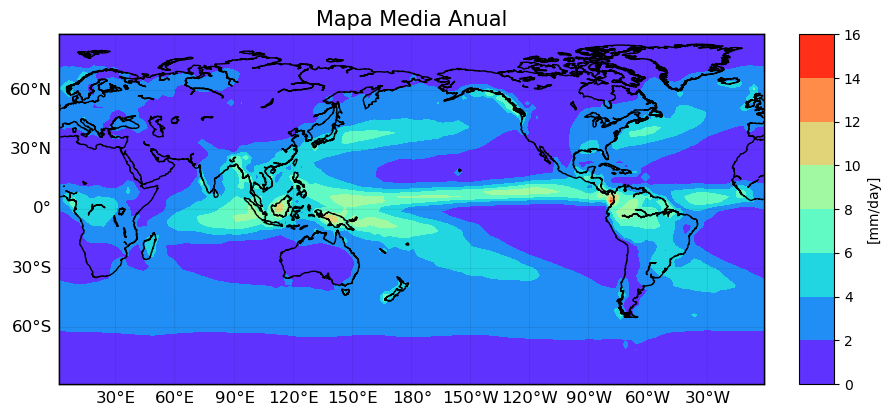

In [26]:
plt.close('all')
fig=plt.figure(figsize=(10,8))   # Se construye la figura con sus dimensiones
# ax=fig.add_subplot(231)        # Si se desea poner las figuras en subfiguras se activa esta linea de código para organizarlas en 2 filas y 3 columnas    
# plt.subplots_adjust(0.1,0.2,1.5,1.5,0.2,0.2) # matplotlib.pyplot.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
plt.title(u'Mapa Media Anual', fontsize=15) # especifica el titulo y su fuente en el mapa

m=Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat),llcrnrlon=np.min(lon), urcrnrlon=np.max(lon),rsphere=6371200.,resolution='l',area_thresh=10000) # define las coordenadas entre otras cosas del mapa
ny=lat.shape[0]; nx=lon.shape[0] # tamaño de lat y lon para construtir la grilla con makegrid (nx,ny)
lons, lats=m.makegrid(nx,ny)  # se crean lons y lats como arreglos bidimensionales, lons varia entre columnas [  1.25,   3.75,   6.25, ..., 353.75, 356.25, 358.75] y lats varia entre filas[[-88.75, -88.75, -88.75, ..., -88.75, -88.75, -88.75],
x,y=m(lons, lats) # x, y son matrices del mismo tamaño que los datos, que contienen las posiciones de los elementos en las coordenadas del mapa. x.shape == y.shape == (72, 144) ==> 'numpy.ndarray'

cs = m.contourf(x,y,Mapa_Media, cmap='rainbow') # se asocian la grilla espacial del mapa x,y con los valores numericos de la ppt en cada coordenada. Se le da tambien el tipo de cmap = colormap

m.colorbar(location='right',pad="5%", label = '[mm/day]') #Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=12, linewidth=0.1) # dibuja los paralelos del mapa. labels = [left,right,top,bottom]
m.drawmeridians(np.arange(0, 360, 30.), labels=[0,1,0,1], size=12, linewidth=0.1) # dibuja los meridianos del mapa. labels = [left,right,top,bottom]
m.drawcoastlines()  # dibuja lineas costeras de los continentes
m.drawmapboundary() # dibuja fronteras
plt.savefig(ruta_figuras + u'Mapa Media Anual.pdf')
plt.show()


#### Se grafica el mapa base media interanual usando cartopy y xarray

C:\ProgramData\anaconda3\envs\baseNew_XaDsCpBmEOF\lib\site-packages\cartopy\mpl\geoaxes.py:917: UserWarning: Attempting to set identical left == right == 1.25 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


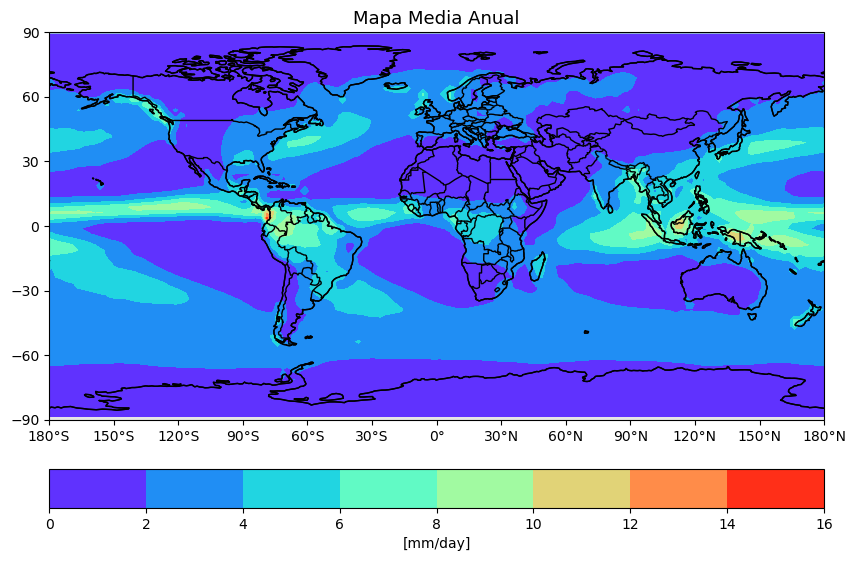

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil # para evitar banda blanca vertical en greenwich
import xarray as xr
import cartopy
import cartopy.mpl.ticker as cticker

plt.close('all')
# Leer los datos utilizando xarray
data = xr.open_dataset(ruta_netcdfs + 'precip.mon.mean.nc')
Mapa_Media = data['precip'].mean(dim='time')
latx = data['lat']

# Ajustar los datos para evitar la banda blanca vertical
lonx = Mapa_Media.lon.values
Mapa_Media, lonx = cutil.add_cyclic_point(Mapa_Media, coord=lonx)# Debe utilizar cartopy.util.add_cyclic_point para que contourf vea los datos como continuos en la dirección x y la línea blanca desaparezca:

# Definir el objeto de Cartopy
fig = plt.figure(figsize= (10,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, Mapa_Media, cmap='rainbow', transform=ccrs.PlateCarree())
plt.colorbar(cs, location='bottom', pad=0.08, label = '[mm/day]')

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30)  , crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LongitudeFormatter())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()
# ax.gridlines()

plt.title('Mapa Media Anual', fontsize=13)
plt.show()

In [28]:
# deconstrucción usando  cutil.add_cyclic_point del anterior bloque de código
print(Mapa_Media.shape)
print(lonx)
print(lonx.shape)

361.25-358.75

(72, 145)
[  1.25   3.75   6.25   8.75  11.25  13.75  16.25  18.75  21.25  23.75
  26.25  28.75  31.25  33.75  36.25  38.75  41.25  43.75  46.25  48.75
  51.25  53.75  56.25  58.75  61.25  63.75  66.25  68.75  71.25  73.75
  76.25  78.75  81.25  83.75  86.25  88.75  91.25  93.75  96.25  98.75
 101.25 103.75 106.25 108.75 111.25 113.75 116.25 118.75 121.25 123.75
 126.25 128.75 131.25 133.75 136.25 138.75 141.25 143.75 146.25 148.75
 151.25 153.75 156.25 158.75 161.25 163.75 166.25 168.75 171.25 173.75
 176.25 178.75 181.25 183.75 186.25 188.75 191.25 193.75 196.25 198.75
 201.25 203.75 206.25 208.75 211.25 213.75 216.25 218.75 221.25 223.75
 226.25 228.75 231.25 233.75 236.25 238.75 241.25 243.75 246.25 248.75
 251.25 253.75 256.25 258.75 261.25 263.75 266.25 268.75 271.25 273.75
 276.25 278.75 281.25 283.75 286.25 288.75 291.25 293.75 296.25 298.75
 301.25 303.75 306.25 308.75 311.25 313.75 316.25 318.75 321.25 323.75
 326.25 328.75 331.25 333.75 336.25 338.75 341.25 343.75 346.25 348

2.5

## Mapa base mediana interanual

#### Se grafica el mapa base mediana interanual usando basemap y dataset

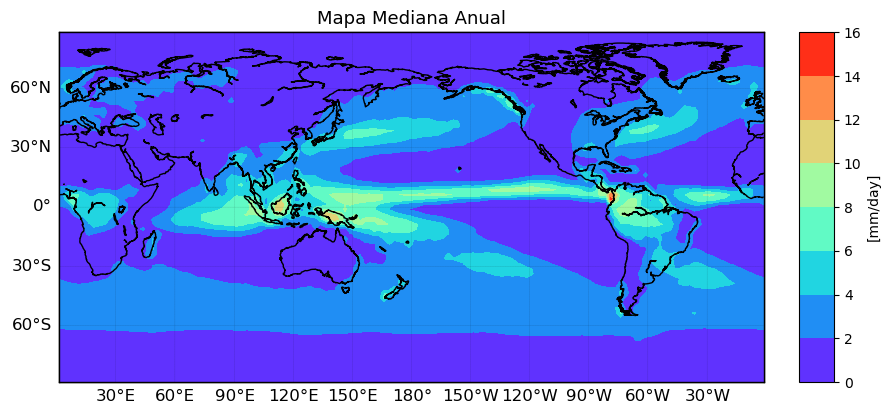

In [29]:
# ax=fig.add_subplot(111) 
fig = plt.figure(figsize=(10,8))
plt.title(u'Mapa Mediana Anual', fontsize=13)
m=Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat),llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), rsphere=6371200.,resolution='l',area_thresh=10000)

ny=lat.shape[0]; nx=lon.shape[0]
lons, lats=m.makegrid(nx,ny)
x,y=m(lons, lats)

cs = m.contourf(x,y,Mapa_Mediana, cmap='rainbow') #lineas de contorno llenas, cmap= con el nombre de los colores

m.colorbar(location='right',pad="5%",label = '[mm/day]') #Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=12,linewidth=0.1)
m.drawmeridians(np.arange(0, 360, 30.),labels=[0,1,0,1], size=12, linewidth=0.1)
m.drawcoastlines()
m.drawmapboundary()

#### Se grafica el mapa base mediana interanual usando cartopy y xarray

(72, 144)
(72, 145)


C:\ProgramData\anaconda3\envs\baseNew_XaDsCpBmEOF\lib\site-packages\cartopy\mpl\geoaxes.py:917: UserWarning: Attempting to set identical left == right == 1.25 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


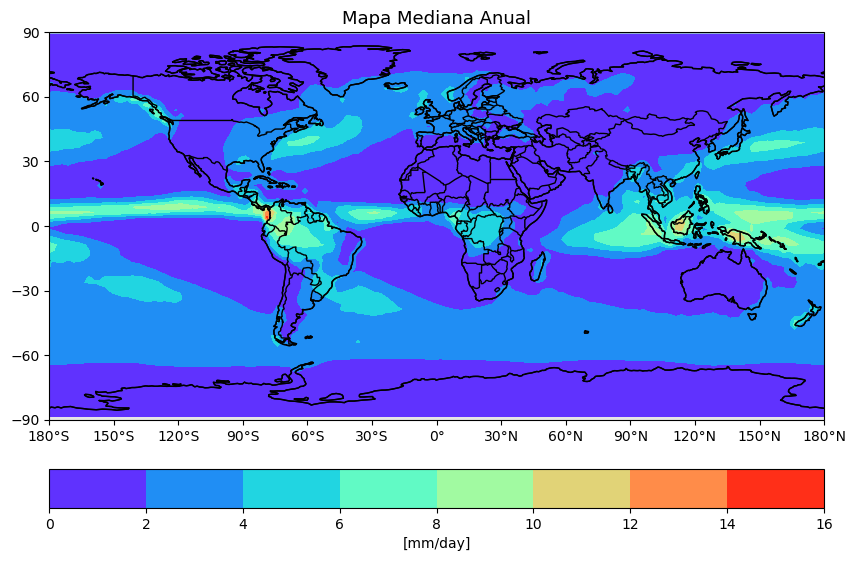

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil # para evitar banda blanca vertical en greenwich
import xarray as xr
import cartopy.mpl.ticker as cticker

plt.close('all')
# Leer los datos utilizando xarray
data = xr.open_dataset(ruta_netcdfs + 'precip.mon.mean.nc')
Mapa_Mediana = data['precip'].median(dim='time')
latx = data['lat']
print(Mapa_Mediana.shape)

# Ajustar los datos para evitar la banda blanca vertical
lonx = Mapa_Mediana.lon.values
Mapa_Mediana, lonx = cutil.add_cyclic_point(Mapa_Mediana, coord=lonx)# Debe utilizar cartopy.util.add_cyclic_point para que contourf vea los datos como continuos en la dirección x y la línea blanca desaparezca:
print(Mapa_Mediana.shape)#  le adiciona un posición más de latitud al mapa para evitar franja vertical blanca

# Definir el objeto de Cartopy
fig = plt.figure(figsize= (10,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, Mapa_Mediana, cmap='rainbow', transform=ccrs.PlateCarree())
plt.colorbar(cs, location='bottom', pad=0.08, label = '[mm/day]')

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30)  , crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LongitudeFormatter())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()
# ax.gridlines()

plt.title('Mapa Mediana Anual', fontsize=13)
plt.show()

## Mapa base desviación estandar interanual

#### Se grafica el mapa base desviación estandar interanual usando Basemap y Dataset

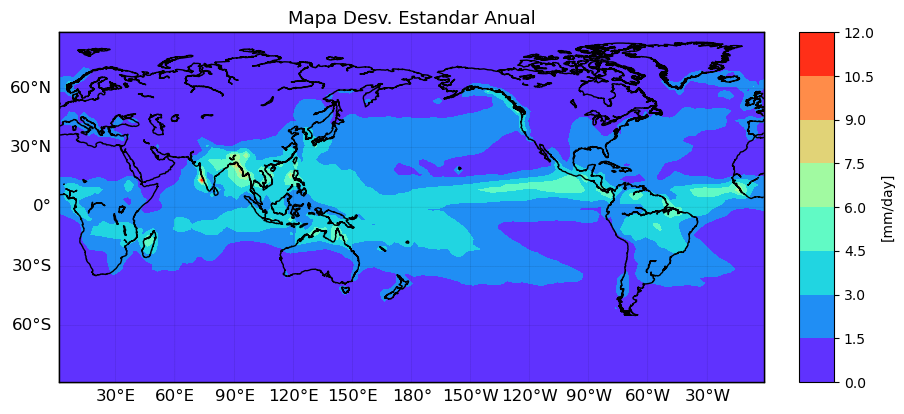

In [31]:
fig = plt.figure(figsize=(10,8))
plt.title(u'Mapa Desv. Estandar Anual', fontsize=13)
m=Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat),\
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), \
          rsphere=6371200.,resolution='l',area_thresh=10000)
ny=lat.shape[0]; nx=lon.shape[0]
lons, lats=m.makegrid(nx,ny)
x,y=m(lons, lats)
cs = m.contourf(x,y,Mapa_Desv_Stnd, cmap='rainbow') #lineas de contorno llenas, cmap= con el nombre de los colores
m.colorbar(location='right',pad="5%",label = '[mm/day]') #Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=12,linewidth=0.1)
m.drawmeridians(np.arange(0, 360, 30.),labels=[0,1,0,1], size=12, linewidth=0.1)
m.drawcoastlines()
m.drawmapboundary()

#### Se grafica el mapa base desviación estandar interanual usando Cartopy y Xarray

(72, 144)
(72, 145)


C:\ProgramData\anaconda3\envs\baseNew_XaDsCpBmEOF\lib\site-packages\cartopy\mpl\geoaxes.py:917: UserWarning: Attempting to set identical left == right == 1.25 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


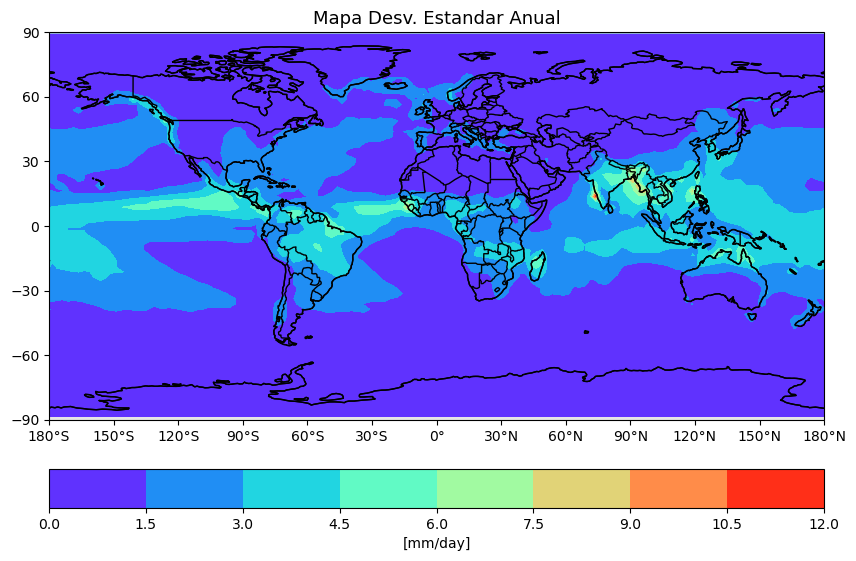

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil # para evitar banda blanca vertical en greenwich
import xarray as xr
import cartopy.mpl.ticker as cticker


plt.close('all')
# Leer los datos utilizando xarray
data = xr.open_dataset(ruta_netcdfs + 'precip.mon.mean.nc')
Mapa_Desv_Stnd = data['precip'].std(dim='time')
latx = data['lat']
print(Mapa_Desv_Stnd.shape)

# Ajustar los datos para evitar la banda blanca vertical
lonx = Mapa_Desv_Stnd.lon.values
Mapa_Desv_Stnd, lonx = cutil.add_cyclic_point(Mapa_Desv_Stnd, coord=lonx)# Debe utilizar cartopy.util.add_cyclic_point para que contourf vea los datos como continuos en la dirección x y la línea blanca desaparezca:
print(Mapa_Desv_Stnd.shape)#  le adiciona un posición más de latitud al mapa para evitar franja vertical blanca

# Definir el objeto de Cartopy
fig = plt.figure(figsize= (10,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, Mapa_Desv_Stnd, cmap='rainbow', transform=ccrs.PlateCarree())
plt.colorbar(cs, location='bottom', pad=0.08, label = '[mm/day]')

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30)  , crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LongitudeFormatter())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()
# ax.gridlines()

plt.title('Mapa Desv. Estandar Anual', fontsize=13)
plt.show()

## Mapa base rango intercuartil interanual

#### Se grafica el mapa base rango intercuartil interanual usando Basemap y Dataset

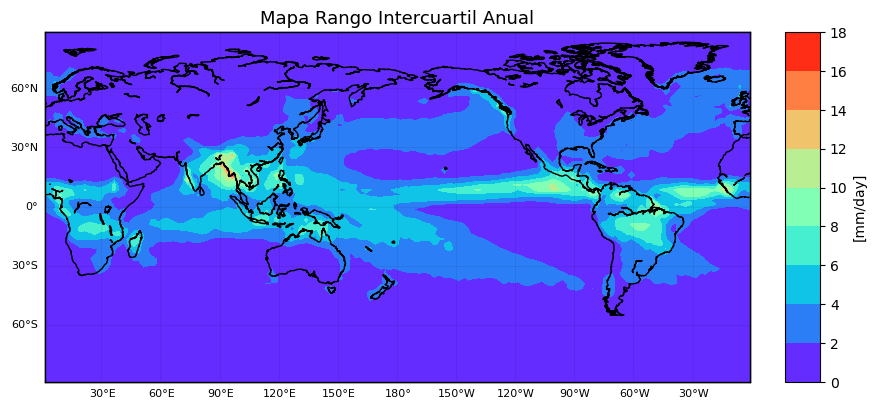

In [33]:
fig = plt.figure(figsize= (10,8))
plt.title(u'Mapa Rango Intercuartil Anual', fontsize=13)
m=Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat), \
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), \
          rsphere=6371200.,resolution='l',area_thresh=10000)
ny=lat.shape[0]; nx=lon.shape[0]
lons, lats=m.makegrid(nx,ny)
x,y=m(lons, lats)
cs = m.contourf(x,y,Mapa_rangointercuartil, cmap='rainbow') #lineas de contorno llenas, cmap= con el nombre de los colores
m.colorbar(location='right',pad="5%",label = '[mm/day]') #Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=8,linewidth=0.1)
m.drawmeridians(np.arange(0, 360, 30.),labels=[0,1,0,1], size=8, linewidth=0.1)
m.drawcoastlines()
m.drawmapboundary()

## Mapa base curtosis interanual

#### Se grafica el mapa base de exceso de curtosis interanual usando Basemap y Dataset

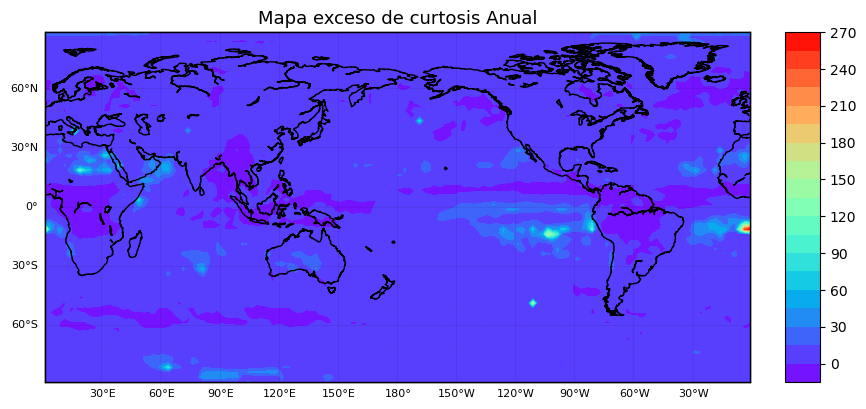

In [34]:
fig = plt.figure(figsize= (10,8))
plt.title(u'Mapa exceso de curtosis Anual', fontsize=13)
m=Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat), \
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon), \
          rsphere=6371200.,resolution='l',area_thresh=10000)
ny=lat.shape[0]; nx=lon.shape[0]
lons, lats=m.makegrid(nx,ny)
x,y=m(lons, lats)
cs = m.contourf(x,y,Mapa_Kurtosis, cmap='rainbow', levels= 20) #lineas de contorno llenas, cmap= con el nombre de los colores
m.colorbar(location='right',pad="5%") #Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=8,linewidth=0.1)
m.drawmeridians(np.arange(0, 360, 30.),labels=[0,1,0,1], size=8, linewidth=0.1)
m.drawcoastlines()
m.drawmapboundary()

#### Se grafica el mapa base de exceso de curtosis interanual usando Cartopy y Xarray

(72, 144)
<class 'numpy.ndarray'>
(463, 72, 144)
(72, 145)


C:\ProgramData\anaconda3\envs\baseNew_XaDsCpBmEOF\lib\site-packages\cartopy\mpl\geoaxes.py:917: UserWarning: Attempting to set identical left == right == 1.25 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])


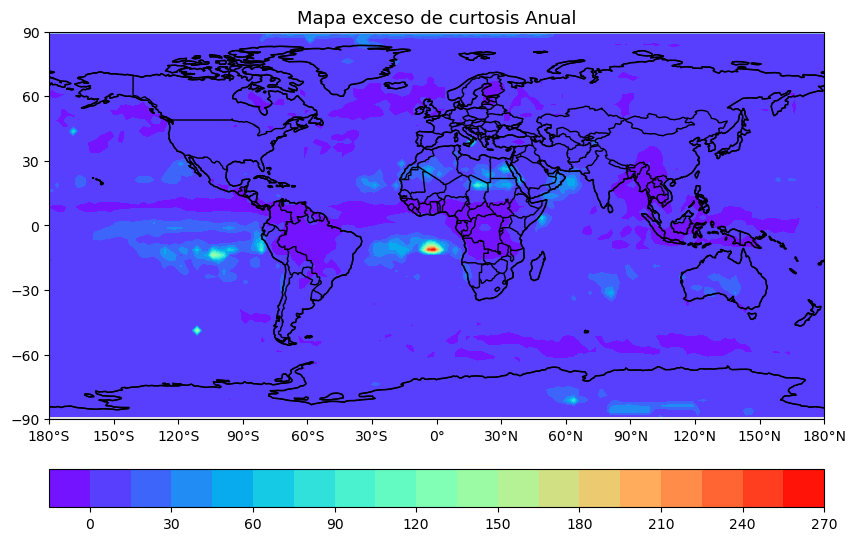

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil # para evitar banda blanca vertical en greenwich
import xarray as xr
import scipy.stats as stats           
import cartopy.mpl.ticker as cticker

plt.close('all')
# Leer los datos utilizando xarray
data = xr.open_dataset(ruta_netcdfs + 'precip.mon.mean.nc')
Mapa_Kurtosis = data['precip']
ex_kurtosis = stats.kurtosis(data['precip'], axis=0, fisher=False)-3
print(ex_kurtosis.shape)
print(type(ex_kurtosis))
latx = data['lat']
print(Mapa_Kurtosis.shape)

# Ajustar los datos para evitar la banda blanca vertical
lonx = Mapa_Kurtosis.lon.values
ex_kurtosis, lonx = cutil.add_cyclic_point(ex_kurtosis, coord=lonx)# Debe utilizar cartopy.util.add_cyclic_point para que contourf vea los datos como continuos en la dirección x y la línea blanca desaparezca:
print(ex_kurtosis.shape)#  le adiciona un posición más de latitud al mapa para evitar franja vertical blanca

# Definir el objeto de Cartopy
fig = plt.figure(figsize= (10,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([np.min(lonx), np.max(lonx), np.min(latx), np.max(latx)], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='0.9')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Crear el mapa de colores utilizando el método contourf
cs = ax.contourf(lonx, latx, ex_kurtosis, cmap='rainbow', transform=ccrs.PlateCarree(),levels= 20)
plt.colorbar(cs, location='bottom', pad=0.08)

# Dibujar los paralelos y meridianos
ax.set_xticks(np.arange(-180, 181, 30), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(-90, 91, 30)  , crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LongitudeFormatter())
ax.xaxis.set_major_formatter(cartopy.mpl.ticker.LatitudeFormatter())

# Agregar los límites de los mapas
ax.coastlines()
# ax.gridlines()

plt.title('Mapa exceso de curtosis Anual', fontsize=13)
plt.show()

# 10. Arreglos tridimensionales

In [36]:
meses= np.array([fechas[i].month for i in range (len(fechas))])#lista de meses se ahorra todo lo que antes hemos hecho meses=[] luego el for i in range y luego convertirlo a array

Matriz_Meses_Media              = np.zeros([12,len(lat),len(lon)])*np.NaN
Matriz_Meses_Mediana            = np.zeros([12,len(lat),len(lon)])*np.NaN
Matriz_Meses_Desv_Stnd          = np.zeros([12,len(lat),len(lon)])*np.NaN
Matriz_Meses_rangointercuartil  = np.zeros([12,len(lat),len(lon)])*np.NaN
Matriz_Meses_Kurtosis           = np.zeros([12,len(lat),len(lon)])*np.NaN

for k in range (1,13):
    posMes = np.where(meses == k)[0]
    preci_meses = precipitacion[posMes,:,:]
#     preci_meses
    for i in range (len(lat)):
        for j in range (len(lon)):
            Matriz_Meses_Media[k-1,i,j]             =np.mean(preci_meses[:,i,j]) 
            Matriz_Meses_Mediana[k-1,i,j]           =np.median(preci_meses[:,i,j])
            Matriz_Meses_Desv_Stnd[k-1,i,j]         =np.std(preci_meses[:,i,j])
            Matriz_Meses_rangointercuartil[k-1,i,j] =iqr(preci_meses[:,i,j])
            Matriz_Meses_Kurtosis[k-1,i,j]          =scipy.stats.kurtosis(preci_meses[:,i,j]) # La función scipy.stats.kurtosis por defecto calcula el exceso de kurtosis de una distribución de datos en lugar de la kurtosis directamente. si desea obtener la kurtosis directamente, debe establecer el argumento fisher en False al llamar a la función scipy.stats.kurtosis
            
Matriz_Meses_Media
Matriz_Meses_Mediana
Matriz_Meses_Desv_Stnd
Matriz_Meses_rangointercuartil
Matriz_Meses_Kurtosis

array([[[ 4.77605156e+00,  1.28373708e+00,  1.07921210e+01, ...,
          5.43975928e+00,  1.28650561e+00,  3.06179982e+00],
        [ 5.04942068e+00,  4.07775356e+00,  5.39428566e+00, ...,
          2.04140431e+00,  1.75772146e+00,  1.83070467e+00],
        [ 1.94999905e+01,  1.53730424e+01,  8.21431381e+00, ...,
          8.27284272e+00,  1.22615239e+01,  1.38695485e+01],
        ...,
        [ 3.97709096e+00,  3.04990742e+00,  3.07829711e+00, ...,
          6.62639489e+00,  5.92724061e+00,  5.03310880e+00],
        [ 3.83611364e+00,  3.48220081e+00,  3.35166623e+00, ...,
          7.03423148e+00,  6.11489942e+00,  4.61626771e+00],
        [ 3.68661586e+00,  3.73949970e+00,  3.86924204e+00, ...,
          4.09596413e+00,  3.62407897e+00,  3.24139836e+00]],

       [[ 1.59207753e+00,  2.18604168e+00,  4.60560945e-01, ...,
          5.06180297e+00,  1.56092454e+00,  1.80234062e+00],
        [ 2.37395269e+00,  1.97610657e+00,  3.31161712e+00, ...,
          2.52864733e+00,  3.70453887e

In [37]:
# Deconstrucción
print(meses.shape)
print(type(meses))
print(meses)

(463,)
<class 'numpy.ndarray'>
[ 1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  7  8  9 10 11 12  1  2  3  4  5  6  7  8  9 10 11 12
  1  2  3  4  5  6  

In [38]:
# Deconstrucción
print(fechas.shape)
print(type(fechas))
print(fechas)

(463,)
<class 'numpy.ndarray'>
[datetime.datetime(1979, 1, 1, 0, 0) datetime.datetime(1979, 2, 1, 0, 0)
 datetime.datetime(1979, 3, 1, 0, 0) datetime.datetime(1979, 4, 1, 0, 0)
 datetime.datetime(1979, 5, 1, 0, 0) datetime.datetime(1979, 6, 1, 0, 0)
 datetime.datetime(1979, 7, 1, 0, 0) datetime.datetime(1979, 8, 1, 0, 0)
 datetime.datetime(1979, 9, 1, 0, 0) datetime.datetime(1979, 10, 1, 0, 0)
 datetime.datetime(1979, 11, 1, 0, 0) datetime.datetime(1979, 12, 1, 0, 0)
 datetime.datetime(1980, 1, 1, 0, 0) datetime.datetime(1980, 2, 1, 0, 0)
 datetime.datetime(1980, 3, 1, 0, 0) datetime.datetime(1980, 4, 1, 0, 0)
 datetime.datetime(1980, 5, 1, 0, 0) datetime.datetime(1980, 6, 1, 0, 0)
 datetime.datetime(1980, 7, 1, 0, 0) datetime.datetime(1980, 8, 1, 0, 0)
 datetime.datetime(1980, 9, 1, 0, 0) datetime.datetime(1980, 10, 1, 0, 0)
 datetime.datetime(1980, 11, 1, 0, 0) datetime.datetime(1980, 12, 1, 0, 0)
 datetime.datetime(1981, 1, 1, 0, 0) datetime.datetime(1981, 2, 1, 0, 0)
 datetime.date

In [39]:
# Deconstrucción
posmes = np.where(meses == k)
print(type(posmes))
posmes = np.where(meses == k)[0]
print(type(posmes))
print(posmes)

<class 'tuple'>
<class 'numpy.ndarray'>
[ 11  23  35  47  59  71  83  95 107 119 131 143 155 167 179 191 203 215
 227 239 251 263 275 287 299 311 323 335 347 359 371 383 395 407 419 431
 443 455]


# 11.  Mapa base estacional

## Mapa base media estacional

#### Se grafica los mapas base de media estacional usando Basemap y Dataset

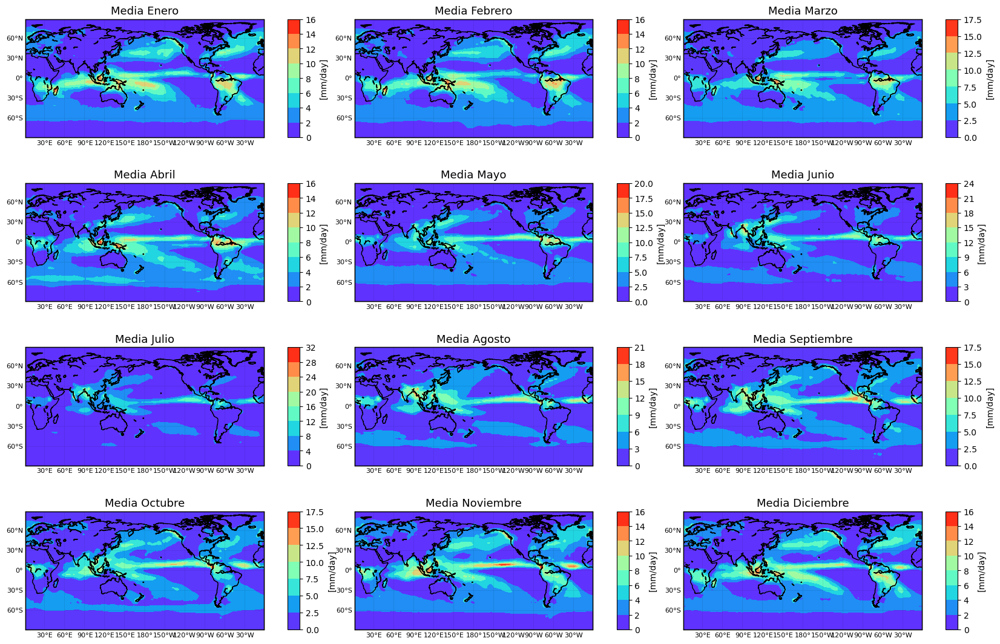

In [40]:
"MAPA MEDIA MENSUAL"
#Mapa de la correlacion de cada mes
Meses=['Enero','Febrero','Marzo','Abril','Mayo','Junio','Julio','Agosto','Septiembre', 'Octubre','Noviembre', 'Diciembre']
# Matrices=['Matriz_Meses_Media[i,:,:]']
fig=plt.figure(figsize=(11,8))
for i in range (12):
    ax=fig.add_subplot(4,3,i+1)
    plt.subplots_adjust(0.1,0.2,1.5,1.5,0.2,0.2)
    plt.title(u'Media '+ Meses[i], fontsize=13)
    m=Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat), llcrnrlon=np.min(lon),urcrnrlon=np.max(lon),rsphere=6371200.,resolution='l',area_thresh=10000)
    
#El codigo anterior es para tener la margen donde se va a dibujar el mapa
    ny=lat.shape[0]; nx=lon.shape[0]
    lons, lats=m.makegrid(nx,ny)
    x,y=m(lons, lats)
    #cs = m.contourf(x,y,np.flipud(Mapa)) #esta linea para qué?
    cs = m.contourf(x,y,Matriz_Meses_Media[i,:,:], cmap='rainbow') #lineas de contorno llenas, cmap= con el nombre de los colores
    
    m.colorbar(location='right',pad="10%",label = '[mm/day]') #Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
    m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=8,linewidth=0.1)
    m.drawmeridians(np.arange(0, 360, 30.),labels=[0,1,0,1], size=8, linewidth=0.1)
    m.drawcoastlines()
    m.drawmapboundary()


#### Se grafica los mapas base de media estacional usando Cartopy y Xarray

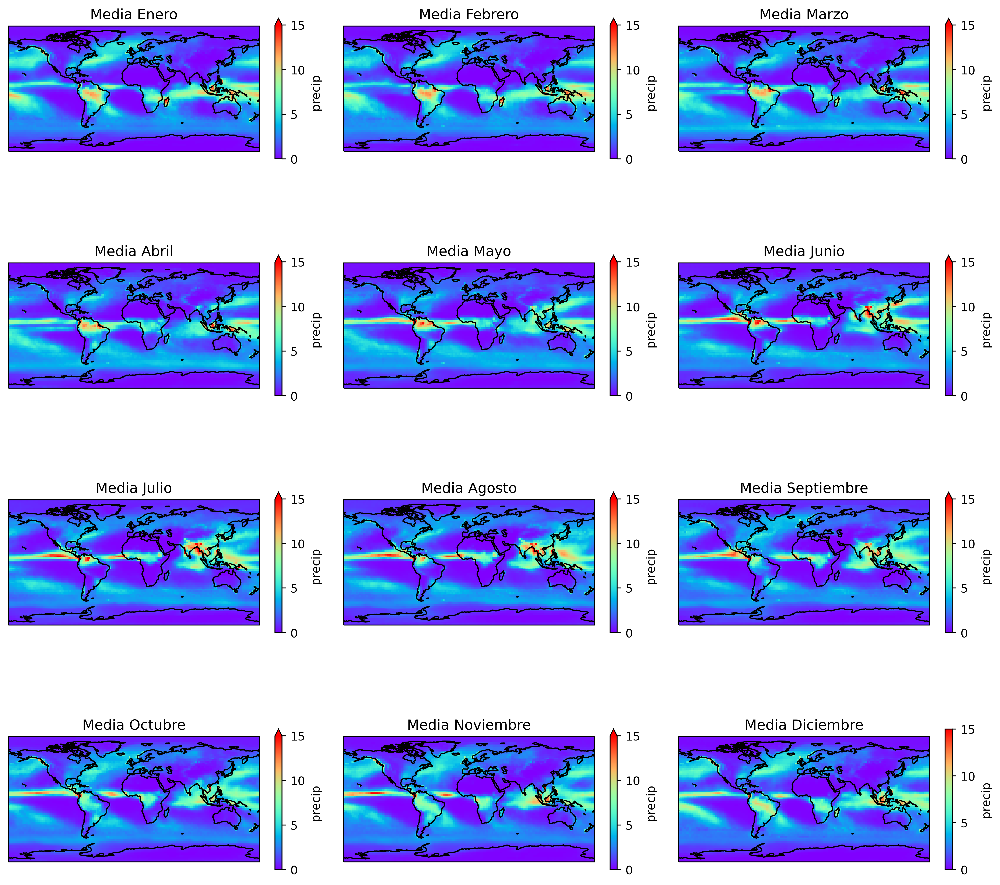

In [41]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Cargamos el archivo NetCDF de precipitación
data = xr.open_dataset(ruta_netcdfs + 'precip.mon.mean.nc')

# Extraemos la variable de precipitación y calculamos el ciclo anual
precip = data['precip']
climatology = precip.groupby('time.month').mean('time')

# Creamos una lista con los nombres de los meses
meses=['Enero','Febrero','Marzo','Abril','Mayo','Junio','Julio','Agosto','Septiembre', 'Octubre','Noviembre', 'Diciembre']

plt.close('all')
# Graficamos los mapas de cada mes en una sola figura
# fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(20, 12), subplot_kw={'projection': ccrs.PlateCarree()})

# Graficamos los mapas de cada mes en una sola figura
fig = plt.figure(figsize=(12, 12), dpi=400)
for i, mes in enumerate(meses):
    plt.subplot(4, 3, i+1, projection=ccrs.PlateCarree())
    climatology[i, :, :].plot(transform=ccrs.PlateCarree(),
                              cmap='rainbow', vmin=0, vmax=15, cbar_kwargs={'shrink': 0.5})
    plt.title('Media '+ mes)# .gca get current axes, tomar los ejes actuales de la figura
    plt.gca().coastlines()
plt.tight_layout()
plt.show()

## Mapa base mediana estacional

#### Se grafica los mapas base de mediana estacional usando Basemap y Dataset

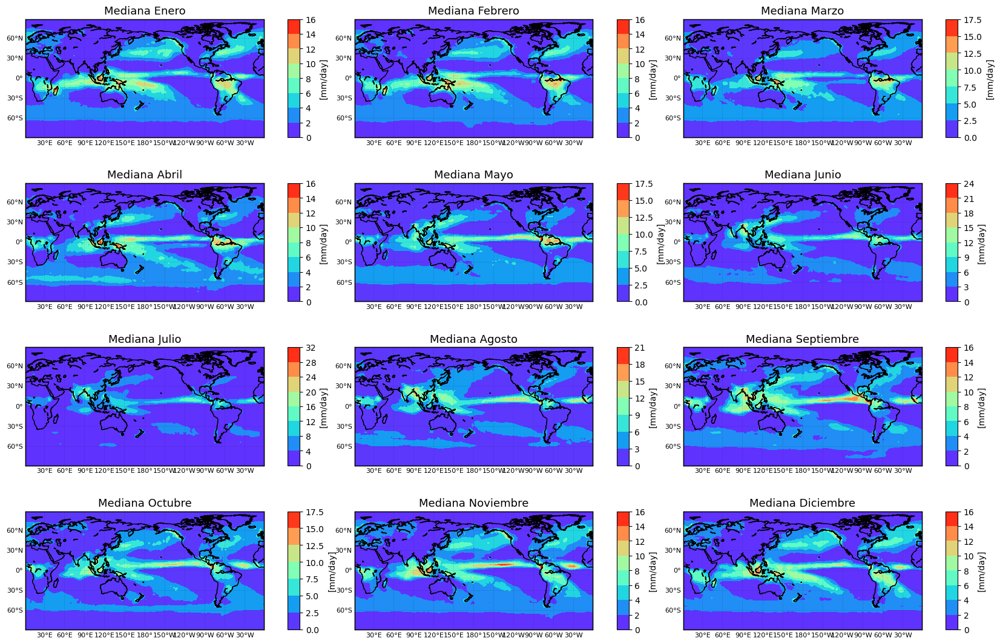

In [42]:
"MAPA MEDIANA MENSUAL"
#Mapa de la correlacion de cada mes
Meses=['Enero','Febrero','Marzo','Abril','Mayo','Junio','Julio','Agosto','Septiembre', 'Octubre','Noviembre', 'Diciembre']
# Matrices=['Matriz_Meses_Media[i,:,:]']
fig=plt.figure(figsize=(11,8))
for i in range (12):
    ax=fig.add_subplot(4,3,i+1)
    plt.subplots_adjust(0.1,0.2,1.5,1.5,0.2,0.2)
    plt.title(u'Mediana '+ Meses[i], fontsize=13)
    m=Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat), \
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon),\
          rsphere=6371200.,resolution='l',area_thresh=10000)
#El codigo anterior es para tener la margen donde se va a dibujar el mapa
    ny=lat.shape[0]; nx=lon.shape[0]
    lons, lats=m.makegrid(nx,ny)
    x,y=m(lons, lats)
    #cs = m.contourf(x,y,np.flipud(Mapa)) #esta linea para qué?
    cs = m.contourf(x,y,Matriz_Meses_Mediana[i,:,:], cmap='rainbow') #lineas de contorno llenas, cmap= con el nombre de los colores
    m.colorbar(location='right',pad="10%",label = '[mm/day]') #Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
    m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=8,linewidth=0.1)
    m.drawmeridians(np.arange(0, 360, 30.),labels=[0,1,0,1], size=8, linewidth=0.1)
    m.drawcoastlines()
    m.drawmapboundary()
#    plt.show()
#%%


#### Se grafica los mapas base de mediana estacional usando Cartopy y Xarray

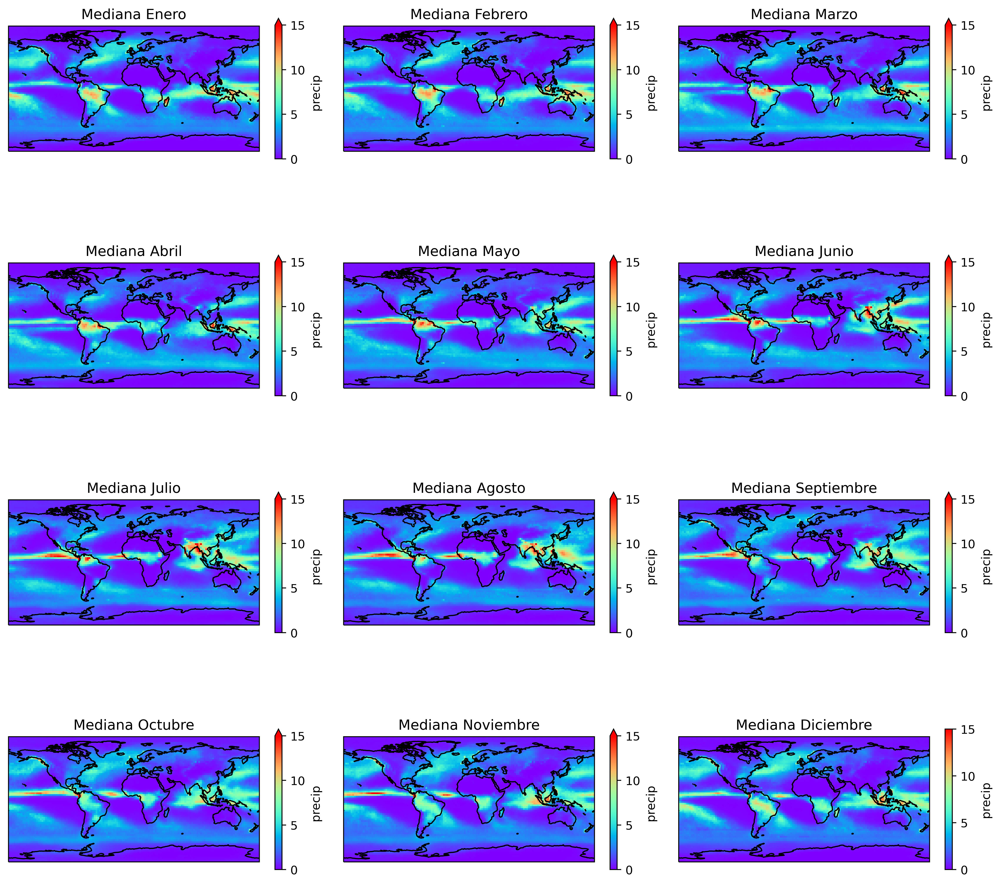

In [43]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Cargamos el archivo NetCDF de precipitación
data = xr.open_dataset(ruta_netcdfs + 'precip.mon.mean.nc')

# Extraemos la variable de precipitación y calculamos el ciclo anual
precip = data['precip']
climatology = precip.groupby('time.month').median('time')

# Creamos una lista con los nombres de los meses
meses=['Enero','Febrero','Marzo','Abril','Mayo','Junio','Julio','Agosto','Septiembre', 'Octubre','Noviembre', 'Diciembre']

plt.close('all')
# Graficamos los mapas de cada mes en una sola figura
# fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(20, 12), subplot_kw={'projection': ccrs.PlateCarree()})

# Graficamos los mapas de cada mes en una sola figura
fig = plt.figure(figsize=(12, 12), dpi=400)
for i, mes in enumerate(meses):
    plt.subplot(4, 3, i+1, projection=ccrs.PlateCarree())
    climatology[i, :, :].plot(transform=ccrs.PlateCarree(),
                              cmap='rainbow', vmin=0, vmax=15, cbar_kwargs={'shrink': 0.5})
    plt.title('Mediana '+ mes)
    plt.gca().coastlines()
plt.tight_layout()
plt.show()

## Mapa base desv. estandar estacional

#### Se grafica los mapas base desviación estandar estacional usando Basemap y Dataset

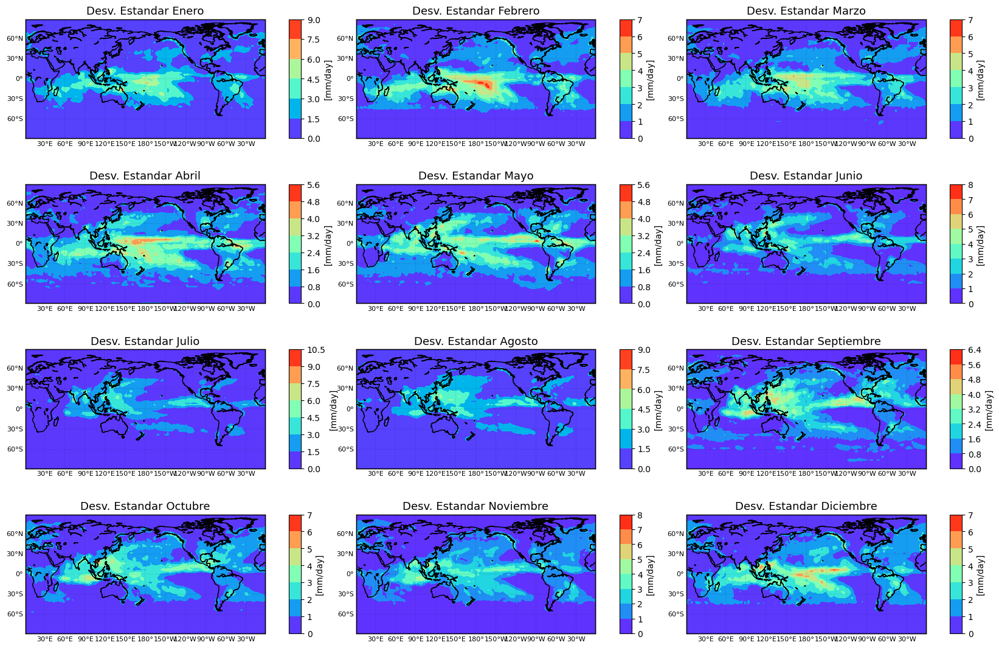

In [44]:
"MAPA DESV STDR MENSUAL"
#Mapa de la correlacion de cada mes
Meses=['Enero','Febrero','Marzo','Abril','Mayo','Junio','Julio','Agosto','Septiembre', 'Octubre','Noviembre', 'Diciembre']
# Matrices=['Matriz_Meses_Media[i,:,:]']
fig=plt.figure(figsize=(11,8))
for i in range (12):
    ax=fig.add_subplot(4,3,i+1)
    plt.subplots_adjust(0.1,0.2,1.5,1.5,0.2,0.2)
    plt.title(u'Desv. Estandar '+ Meses[i], fontsize=13)
    m=Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat), \
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon),\
          rsphere=6371200.,resolution='l',area_thresh=10000)
#El codigo anterior es para tener la margen donde se va a dibujar el mapa
    ny=lat.shape[0]; nx=lon.shape[0]
    lons, lats=m.makegrid(nx,ny)
    x,y=m(lons, lats)
    #cs = m.contourf(x,y,np.flipud(Mapa)) #esta linea para qué?
    cs = m.contourf(x,y,Matriz_Meses_Desv_Stnd[i,:,:], cmap='rainbow') #lineas de contorno llenas, cmap= con el nombre de los colores
    m.colorbar(location='right',pad="10%",label = '[mm/day]') #Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
    m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=8,linewidth=0.1)
    m.drawmeridians(np.arange(0, 360, 30.),labels=[0,1,0,1], size=8, linewidth=0.1)
    m.drawcoastlines()
    m.drawmapboundary()

#### Se grafica los mapas base desviación estandar estacional usando Cartopy y Xarray

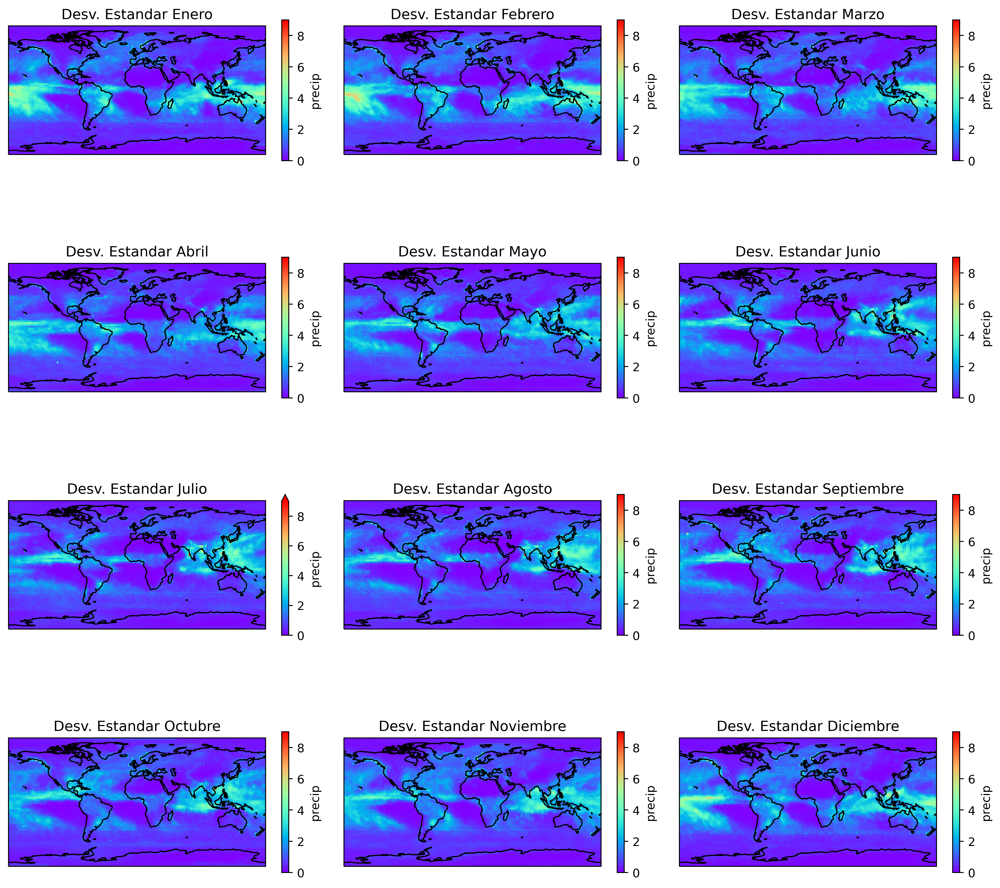

In [45]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Cargamos el archivo NetCDF de precipitación
data = xr.open_dataset(ruta_netcdfs + 'precip.mon.mean.nc')

# Extraemos la variable de precipitación y calculamos el ciclo anual
precip = data['precip']
climatology = precip.groupby('time.month').std('time')

# Creamos una lista con los nombres de los meses
meses=['Enero','Febrero','Marzo','Abril','Mayo','Junio','Julio','Agosto','Septiembre', 'Octubre','Noviembre', 'Diciembre']

plt.close('all')

# Graficamos los mapas de cada mes en una sola figura
fig = plt.figure(figsize=(12, 12), dpi=400)
for i, mes in enumerate(meses):
    plt.subplot(4, 3, i+1, projection=ccrs.PlateCarree())
    climatology[i, :, :].plot(transform=ccrs.PlateCarree(),
                              cmap='rainbow', vmin=0, vmax=9, cbar_kwargs={'shrink': 0.5})
    plt.title('Desv. Estandar '+ mes)
    plt.gca().coastlines()
plt.tight_layout()
plt.show()

## Mapa base rango intercuartil estacional

#### Se grafican los mapas base de rango intercuartil estacional, usando Basemap y Dataset

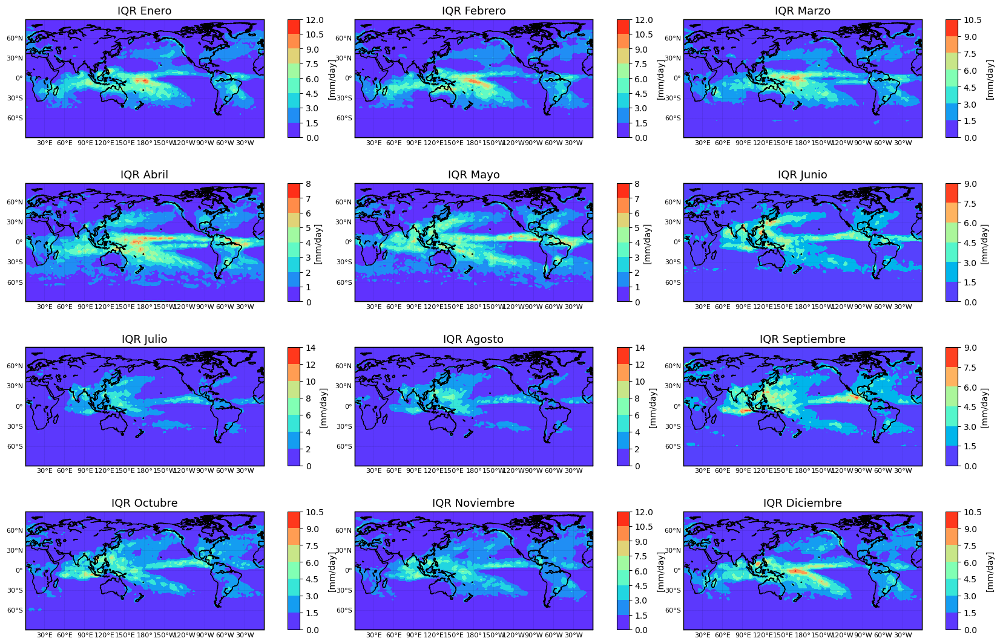

In [46]:
"MAPA RANGO INTERCUARTIL MENSUAL"
#Mapa de la correlacion de cada mes
Meses=['Enero','Febrero','Marzo','Abril','Mayo','Junio','Julio','Agosto','Septiembre', 'Octubre','Noviembre', 'Diciembre']
# Matrices=['Matriz_Meses_Media[i,:,:]']
fig=plt.figure(figsize=(11,8))
for i in range (12):
    ax=fig.add_subplot(4,3,i+1)
    plt.subplots_adjust(0.1,0.2,1.5,1.5,0.2,0.2)
    plt.title(u'IQR '+ Meses[i], fontsize=13)
    m=Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat), \
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon),\
          rsphere=6371200.,resolution='l',area_thresh=10000)
#El codigo anterior es para tener la margen donde se va a dibujar el mapa
    ny=lat.shape[0]; nx=lon.shape[0]
    lons, lats=m.makegrid(nx,ny)
    x,y=m(lons, lats)
    #cs = m.contourf(x,y,np.flipud(Mapa)) #esta linea para qué?
    cs = m.contourf(x,y,Matriz_Meses_rangointercuartil[i,:,:], cmap='rainbow') #lineas de contorno llenas, cmap= con el nombre de los colores
    m.colorbar(location='right',pad="10%",label = '[mm/day]') #Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
    m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=8,linewidth=0.1)
    m.drawmeridians(np.arange(0, 360, 30.),labels=[0,1,0,1], size=8, linewidth=0.1)
    m.drawcoastlines()
    m.drawmapboundary()


#### Se grafican los mapas base de rango intercuartil estacional, usando Basemap y Dataset

Average Monthly Rate of Precipitation


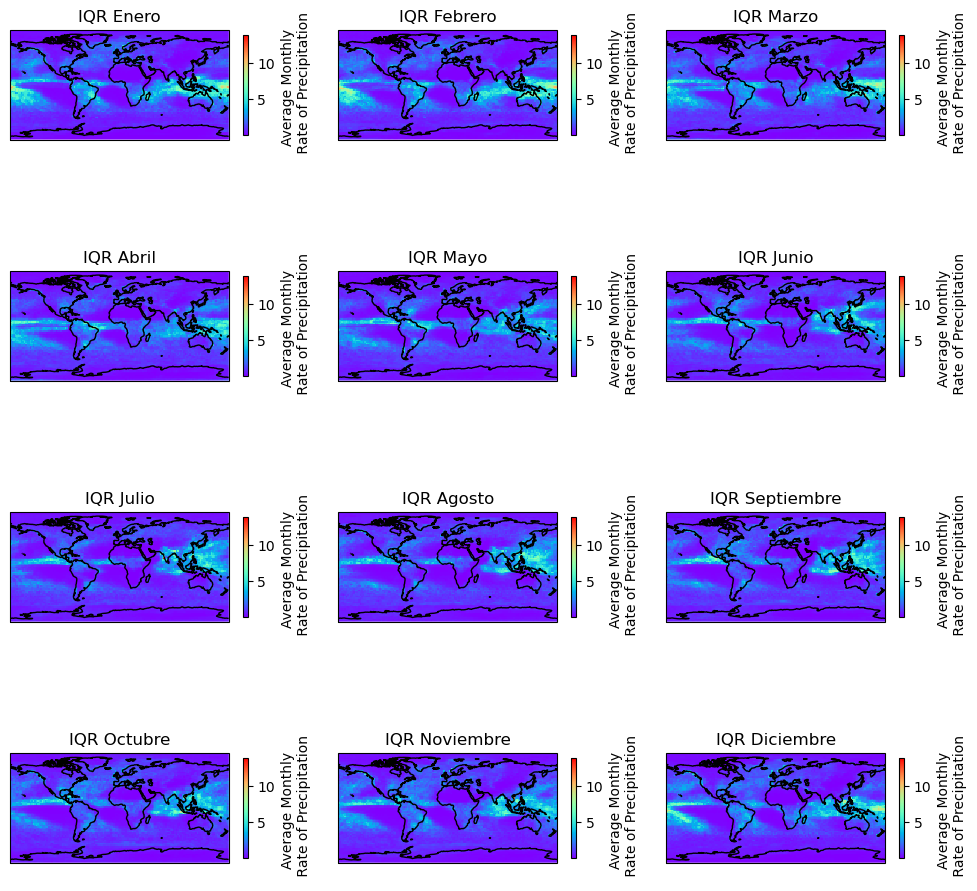

In [47]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Cargamos el archivo NetCDF de precipitación
data = xr.open_dataset(ruta_netcdfs + 'precip.mon.mean.nc')

# Extraemos la variable de precipitación y calculamos la diferencia entre los cuantiles 75 y 25 del ciclo anual
precip = data['precip']
climatology = precip.groupby('time.month').quantile(q=[0.25, 0.75], dim='time')
diff = climatology.sel(quantile=0.75) - climatology.sel(quantile=0.25)

# Calculamos el valor mínimo y máximo de la diferencia para establecer los límites del colorbar
vmin = diff.min().values
vmax = diff.max().values

# Creamos una lista con los nombres de los meses
Meses=['Enero','Febrero','Marzo','Abril','Mayo','Junio','Julio','Agosto','Septiembre', 'Octubre','Noviembre', 'Diciembre']
variable_name = data['precip'].long_name
print(variable_name)
labelBarra = "Average Monthly \n Rate of Precipitation"

# Graficamos los mapas de cada mes en una sola figura
fig = plt.figure(figsize=(12, 12), dpi=100)
for i, mes in enumerate(Meses):
    plt.subplot(4, 3, i+1, projection=ccrs.PlateCarree())
    diff.sel(month=i+1).plot(transform=ccrs.PlateCarree(),
                             cmap='rainbow', vmin=vmin, vmax=vmax,
                             add_colorbar=True, cbar_kwargs={'shrink': 0.5, 'label': labelBarra})
    plt.title('IQR ' + mes)
    plt.gca().coastlines()


## Mapa base kurtosis estacional

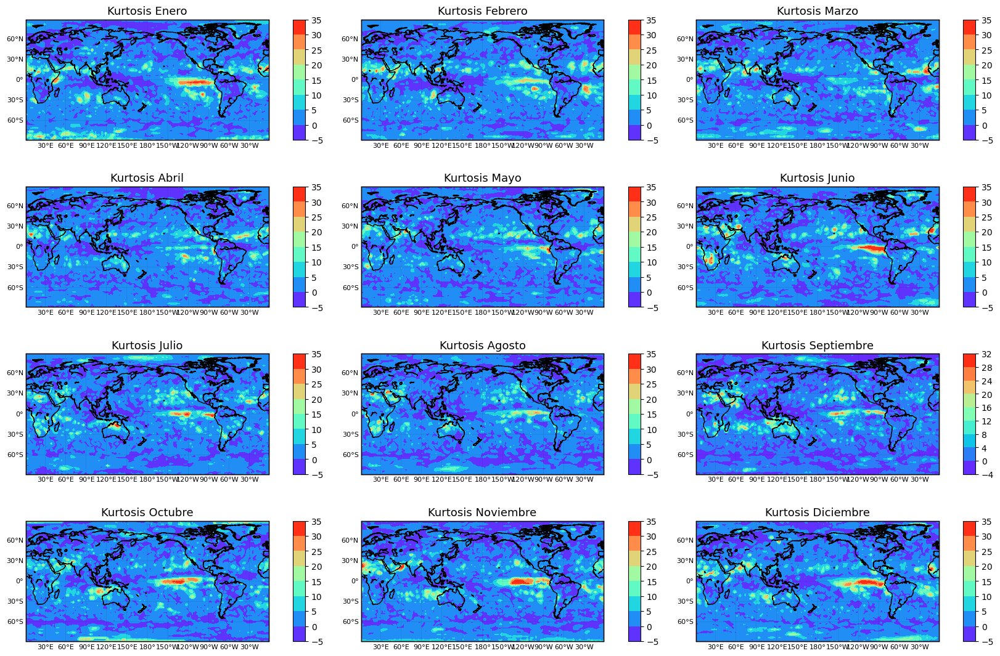

In [48]:
"MAPA KURTOSIS MENSUAL"
#Mapa de la correlacion de cada mes
Meses=['Enero','Febrero','Marzo','Abril','Mayo','Junio','Julio','Agosto','Septiembre', 'Octubre','Noviembre', 'Diciembre']
# Matrices=['Matriz_Meses_Media[i,:,:]']
fig=plt.figure(figsize=(11,8))
for i in range (12):
    ax=fig.add_subplot(4,3,i+1)
    plt.subplots_adjust(0.1,0.2,1.5,1.5,0.2,0.2)
    plt.title(u'Kurtosis '+ Meses[i], fontsize=13)
    m=Basemap(llcrnrlat=np.min(lat),urcrnrlat=np.max(lat), \
          llcrnrlon=np.min(lon),urcrnrlon=np.max(lon),\
          rsphere=6371200.,resolution='l',area_thresh=10000)
#El codigo anterior es para tener la margen donde se va a dibujar el mapa
    ny=lat.shape[0]; nx=lon.shape[0]
    lons, lats=m.makegrid(nx,ny)
    x,y=m(lons, lats)
    #cs = m.contourf(x,y,np.flipud(Mapa)) #esta linea para qué?
    cs = m.contourf(x,y,Matriz_Meses_Kurtosis[i,:,:], cmap='rainbow') #lineas de contorno llenas, cmap= con el nombre de los colores
    m.colorbar(location='right',pad="10%") #Para ubicar la barra de colores (left, right, bottom and top) y pad= cierto % es para alejar la barra del mapa
    m.drawparallels(np.arange(-90.,90,30.), labels=[1,0,0,0], size=8,linewidth=0.1)
    m.drawmeridians(np.arange(0, 360, 30.),labels=[0,1,0,1], size=8, linewidth=0.1)
    m.drawcoastlines()
    m.drawmapboundary()

# 12. Figuras estadísticos global

## Estadísticos Media, Mediana, Percentiles 25 - 75 aplicados a Global

### Usando dataset y arreglos de numpy

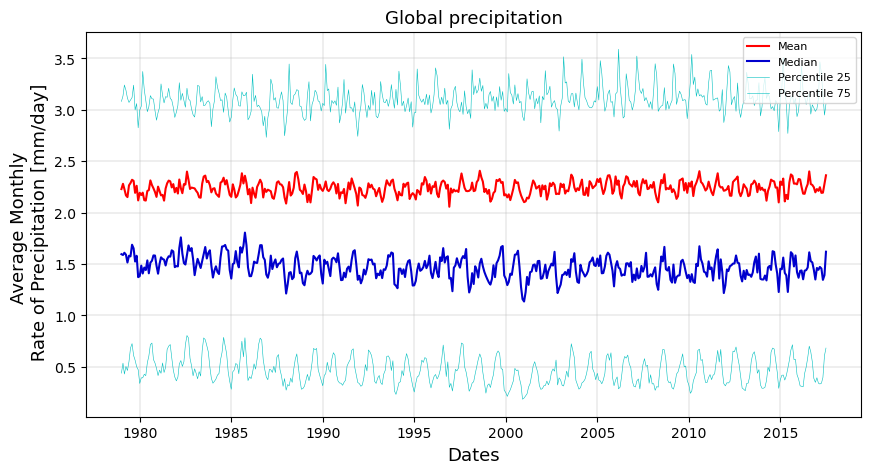

In [49]:
"Graficación Media global, Mediana global, Percentiles 25- 75 Global"
plt.figure(figsize=[10,5])
plt.plot(fechas,Mean, 'r', label = 'Mean')
plt.plot(fechas,Median, color='mediumblue', label = 'Median')
#plt.plot(fechas,Mean + desv,'r',label=u'Desviación Estandar')
#plt.plot(fechas,Mean - desv,'r')
plt.plot(fechas, perc_25, color='c',label = 'Percentile 25',lw=0.4)
plt.plot(fechas, perc_75, color='c',label = 'Percentile 75',lw=0.4)
#plt.fill_between(fechas, Mean - desv,Mean + desv, alpha=0.2)
plt.legend(loc= "upper right",fontsize=8)
plt.xlabel('Dates', fontsize=13)
plt.ylabel("Average Monthly \n Rate of Precipitation [mm/day]", fontsize=13)
plt.title(u'Global precipitation', fontsize=13)
plt.grid(lw=0.3)

### Usando xarray

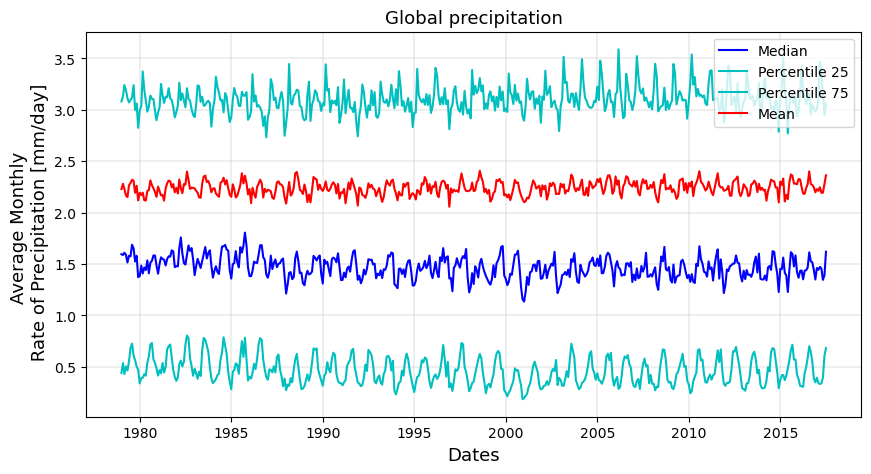

In [50]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

ds = xr.open_dataset(ruta_netcdfs + 'precip.mon.mean.nc')

precip_mean   = ds['precip'].mean(dim=['lat', 'lon'])
precip_median = ds['precip'].median(dim=['lat', 'lon'])
precip_p25    = ds['precip'].quantile(0.25, dim=['lat', 'lon'])
precip_p75    = ds['precip'].quantile(0.75, dim=['lat', 'lon'])

# Obtener los valores de tiempo y precipitación como matrices NumPy
time = precip_mean['time'].values
precip_mean_values   = precip_mean.values
precip_median_values = precip_median.values
precip_p25_values    = precip_p25.values
precip_p75_values    = precip_p75.values

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=[10,5])
# Graficar la serie de tiempo de la mediana espacial de la precipitación
ax.plot(time, precip_median_values, label='Median', c = 'b')
# Graficar la serie de tiempo del percentil 25 de la precipitación
ax.plot(time, precip_p25_values, label='Percentile 25', c = 'c')
# Graficar la serie de tiempo del percentil 75 de la precipitación
ax.plot(time, precip_p75_values, label='Percentile 75', c = 'c')
# Graficar la serie de tiempo de la media espacial de la precipitación
ax.plot(time, precip_mean_values, label='Mean', c = 'r')

# Agregar etiquetas de los ejes y un título
ax.set_xlabel('Dates',fontsize=13)
ax.set_ylabel("Average Monthly \n Rate of Precipitation [mm/day]", fontsize=13)
ax.set_title(u'Global precipitation',fontsize=13)
ax.legend()
plt.grid(lw=0.3)

# Mostrar la figura
plt.show()

# 13. Figuras estadísticos ubicaciones especificas

## Media aplicada a Guajira, Atlántico y Pacifico

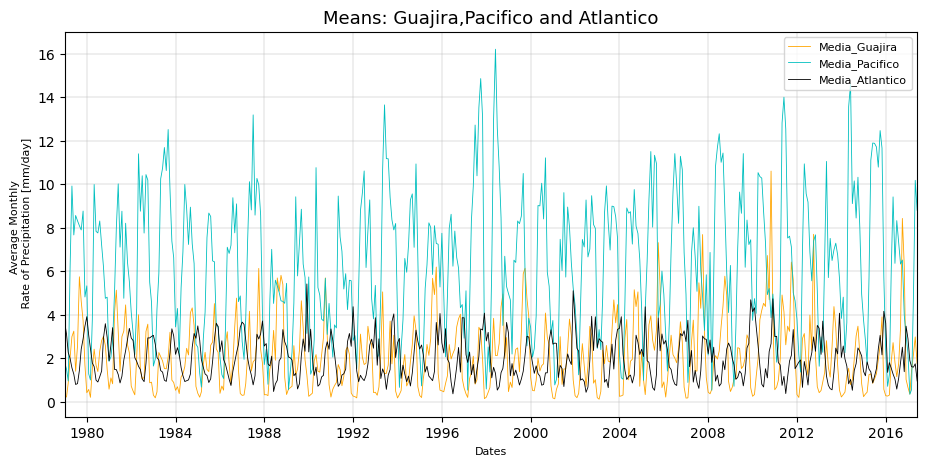

In [51]:
"Graficación Medias:Global,Guajira,Pacifico,Atlantico"
plt.figure(figsize=[11,5])
plt.title(u'Means: Guajira,Pacifico and Atlantico', fontsize=13)
#plt.plot(fechas,Mean, 'red', label = 'Media Global',lw=0.6)
plt.plot(fechas,Media_Guajira, color='orange', label = 'Media_Guajira',lw=0.6)
plt.plot(fechas,Media_Pacifico, color='c', label = 'Media_Pacifico',lw=0.6)         
plt.plot(fechas,Media_Atlantico, color='k', label = 'Media_Atlantico',lw=0.6)
plt.xlim([datetime.datetime(1979, 1, 1, 0, 0),datetime.datetime(2017, 6, 1, 0, 0)])
plt.ylabel("Average Monthly \n Rate of Precipitation [mm/day]", fontsize=8)
plt.xlabel('Dates', fontsize=8)
plt.legend(loc= "upper right",fontsize=8)
plt.grid(lw=0.3)

### Usando xarray

In [52]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Abrir el archivo netCDF
ds = xr.open_dataset(ruta_netcdfs + 'precip.mon.mean.nc')

# Seleccionar las áreas específicas
Guajira_Lat = np.where((ds['lat'] > 10) & (ds['lat'] < 14))[0]
Guajira_Lon = np.where((ds['lon'] > 285) & (ds['lon'] < 290))[0]
Pacifico_Lat = np.where((ds['lat'] > 2) & (ds['lat'] < 8))[0]
Pacifico_Lon = np.where((ds['lon'] > 275) & (ds['lon'] < 280))[0]
Atlantico_Lat = np.where((ds['lat'] > 28) & (ds['lat'] < 47))[0]
Atlantico_Lon = np.where((ds['lon'] > 325) & (ds['lon'] < 345))[0]

# Calcular las estadísticas espaciales para cada área
Guajira_precip_mean     = ds['precip'][:, Guajira_Lat, Guajira_Lon].mean(dim=['lat', 'lon'])
Guajira_precip_median   = ds['precip'][:, Guajira_Lat, Guajira_Lon].median(dim=['lat', 'lon'])
Guajira_precip_p25      = ds['precip'][:, Guajira_Lat, Guajira_Lon].quantile(0.25, dim=['lat', 'lon'])
Guajira_precip_p75      = ds['precip'][:, Guajira_Lat, Guajira_Lon].quantile(0.75, dim=['lat', 'lon'])
Guajira_precip_desv     = ds['precip'][:, Guajira_Lat, Guajira_Lon].std(dim=['lat', 'lon'])

Pacifico_precip_mean    = ds['precip'][:, Pacifico_Lat, Pacifico_Lon].mean(dim=['lat', 'lon'])
Pacifico_precip_median  = ds['precip'][:, Pacifico_Lat, Pacifico_Lon].median(dim=['lat', 'lon'])
Pacifico_precip_p25     = ds['precip'][:, Pacifico_Lat, Pacifico_Lon].quantile(0.25, dim=['lat', 'lon'])
Pacifico_precip_p75     = ds['precip'][:, Pacifico_Lat, Pacifico_Lon].quantile(0.75, dim=['lat', 'lon'])
Pacifico_precip_desv    = ds['precip'][:, Pacifico_Lat, Pacifico_Lon].std(dim=['lat', 'lon'])

Atlantico_precip_mean   = ds['precip'][:, Atlantico_Lat, Atlantico_Lon].mean(dim=['lat', 'lon'])
Atlantico_precip_median = ds['precip'][:, Atlantico_Lat, Atlantico_Lon].median(dim=['lat', 'lon'])
Atlantico_precip_p25    = ds['precip'][:, Atlantico_Lat, Atlantico_Lon].quantile(0.25, dim=['lat', 'lon'])
Atlantico_precip_p75    = ds['precip'][:, Atlantico_Lat, Atlantico_Lon].quantile(0.75, dim=['lat', 'lon'])
Atlantico_precip_desv   = ds['precip'][:, Atlantico_Lat, Atlantico_Lon].std(dim=['lat', 'lon'])

# Obtener los valores de tiempo y precipitación como matrices NumPy para cada área
time = ds['time'].values

Guajira_precip_mean_values     = Guajira_precip_mean.values
Guajira_precip_median_values   = Guajira_precip_median.values
Guajira_precip_p25_values      = Guajira_precip_p25.values
Guajira_precip_p75_values      = Guajira_precip_p75.values
Guajira_precip_desv_values     = Guajira_precip_desv.values

Pacifico_precip_mean_values    = Pacifico_precip_mean.values
Pacifico_precip_median_values  = Pacifico_precip_median.values
Pacifico_precip_p25_values     = Pacifico_precip_p25.values
Pacifico_precip_p75_values     = Pacifico_precip_p75.values
Pacifico_precip_desv_values    = Pacifico_precip_desv.values

Atlantico_precip_mean_values   = Atlantico_precip_mean.values
Atlantico_precip_median_values = Atlantico_precip_median.values
Atlantico_precip_p25_values    = Atlantico_precip_p25.values
Atlantico_precip_p75_values    = Atlantico_precip_p75.values
Atlantico_precip_desv_values   = Atlantico_precip_desv.values


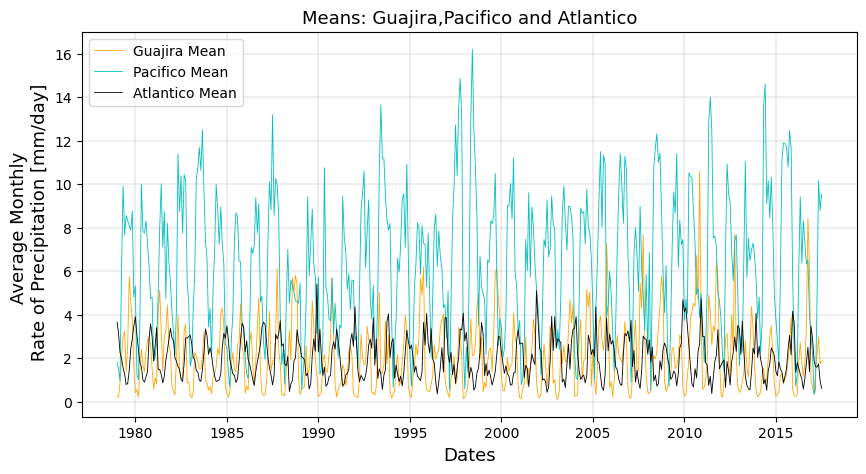

In [53]:
# Crear una figura y un eje
fig, ax = plt.subplots(figsize=[10,5])
# Graficar la serie de tiempo de la media espacial de la precipitación
ax.plot(time, Guajira_precip_mean_values  , label='Guajira Mean'  , c = 'orange',lw=0.6)
ax.plot(time, Pacifico_precip_mean_values , label='Pacifico Mean' , c = 'c',lw=0.6)
ax.plot(time, Atlantico_precip_mean_values, label='Atlantico Mean', c = 'k',lw=0.6)

# Agregar etiquetas de los ejes y un título
ax.set_xlabel('Dates',fontsize=13)
ax.set_ylabel("Average Monthly \n Rate of Precipitation [mm/day]", fontsize=13)
ax.set_title(u'Means: Guajira,Pacifico and Atlantico',fontsize=13)
ax.legend()
plt.grid(lw=0.3)

# Mostrar la figura
plt.show()

## Mediana aplicada a Guajira, Atlántico y Pacifico

### Usando dataset y arreglos de numpy

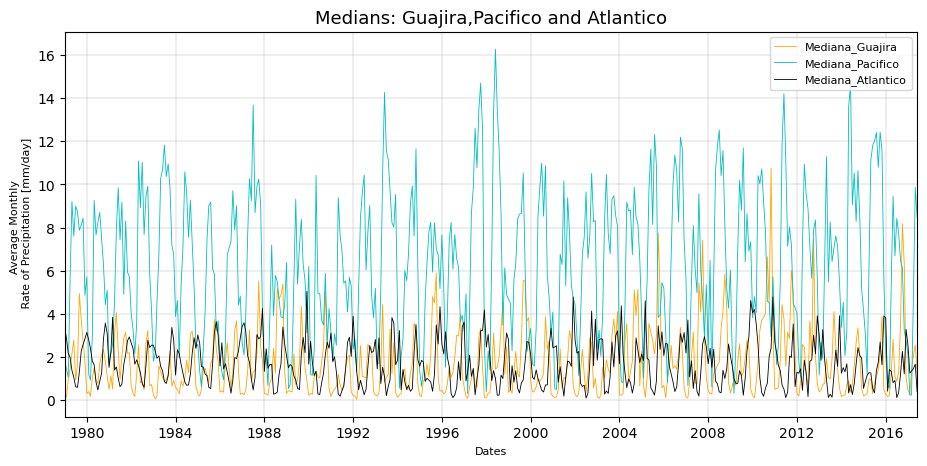

In [54]:
"Graficación Medianas:Global,Guajira,Pacifico,Atlantico"
"Graficación Medias:Global,Guajira,Pacifico,Atlantico"
plt.figure(figsize=[11,5])
plt.title(u'Medians: Guajira,Pacifico and Atlantico', fontsize=13)
#plt.plot(fechas,Median, 'red', label = 'Mediana Global',lw=0.6)
plt.plot(fechas,Mediana_Guajira, color='orange', label = 'Mediana_Guajira',lw=0.6)
plt.plot(fechas,Mediana_Pacifico, color='c', label = 'Mediana_Pacifico',lw=0.6)         
plt.plot(fechas,Mediana_Atlantico, color='k', label = 'Mediana_Atlantico',lw=0.6)
plt.xlim([datetime.datetime(1979, 1, 1, 0, 0),datetime.datetime(2017, 6, 1, 0, 0)])
plt.ylabel("Average Monthly \n Rate of Precipitation [mm/day]", fontsize=8)
plt.xlabel('Dates', fontsize=8)
plt.legend(loc= "upper right",fontsize=8)
plt.grid(lw=0.3)

### Usando xarray

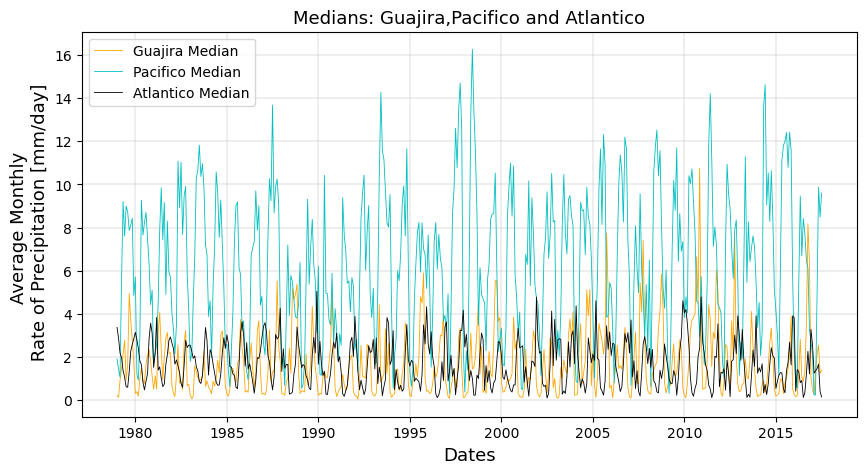

In [55]:
# Crear una figura y un eje
fig, ax = plt.subplots(figsize=[10,5])
# Graficar la serie de tiempo de la mediana espacial de la precipitación
ax.plot(time, Guajira_precip_median_values  , label='Guajira Median'  , c = 'orange',lw=0.6)
ax.plot(time, Pacifico_precip_median_values , label='Pacifico Median' , c = 'c',lw=0.6)
ax.plot(time, Atlantico_precip_median_values, label='Atlantico Median', c = 'k',lw=0.6)

# Agregar etiquetas de los ejes y un título
ax.set_xlabel('Dates',fontsize=13)
ax.set_ylabel("Average Monthly \n Rate of Precipitation [mm/day]", fontsize=13)
ax.set_title(u'Medians: Guajira,Pacifico and Atlantico',fontsize=13)
ax.legend()
plt.grid(lw=0.3)

# Mostrar la figura
plt.show()

## Desviación estándar aplicada a Guajira, Atlántico y Pacifico

### Usando dataset y arreglos de numpy

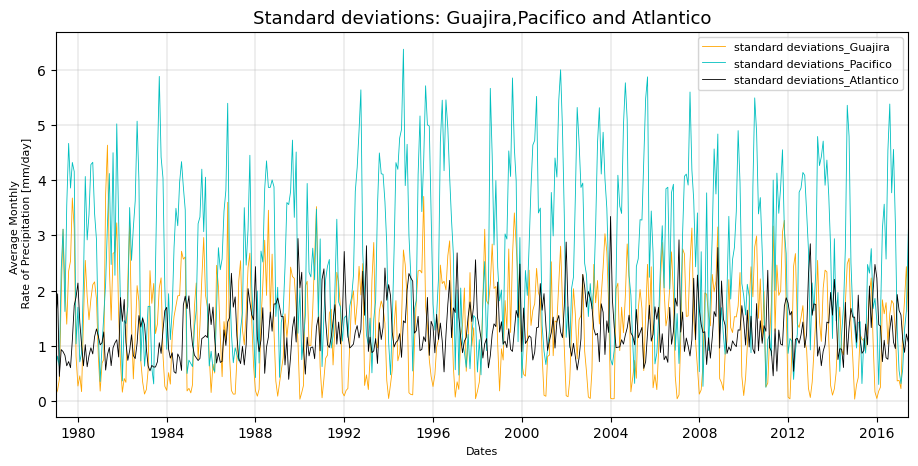

In [56]:
"Graficación Desviaciones estandar:Global,Guajira,Pacifico,Atlantico"
plt.figure(figsize=[11,5])
plt.title(u'Standard deviations: Guajira,Pacifico and Atlantico', fontsize=13)
#plt.plot(fechas,desv, 'red', label = 'Desv_estandar_Global',lw=0.6)
plt.plot(fechas,desv_Guajira, color='orange', label = 'standard deviations_Guajira',lw=0.6)
plt.plot(fechas,desv_Pacifico, color='c', label = 'standard deviations_Pacifico',lw=0.6)         
plt.plot(fechas,desv_Atlantico, color='k', label = 'standard deviations_Atlantico',lw=0.6)
plt.xlim([datetime.datetime(1979, 1, 1, 0, 0),datetime.datetime(2017, 6, 1, 0, 0)])
plt.ylabel("Average Monthly \n Rate of Precipitation [mm/day]", fontsize=8)
plt.xlabel('Dates', fontsize=8)
plt.legend(loc= "upper right",fontsize=8)
plt.grid(lw=0.3)


### Usando xarray

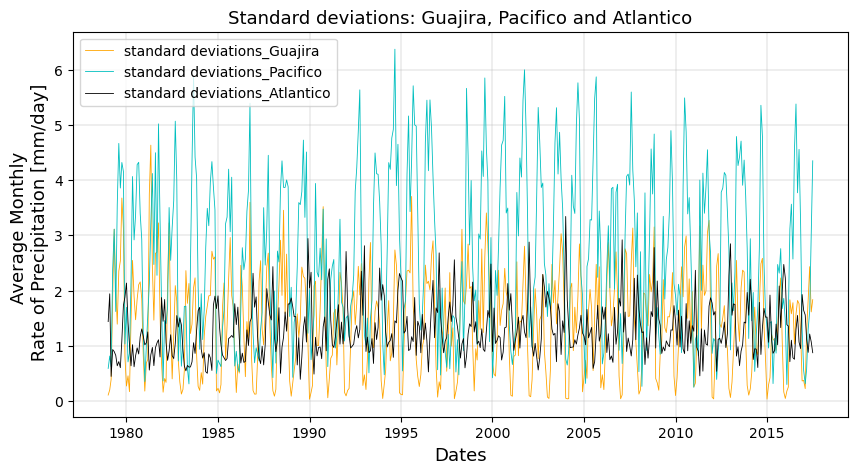

In [57]:
# Crear una figura y un eje
fig, ax = plt.subplots(figsize=[10,5])
# Graficar la serie de tiempo de la desv estandar espacial de la precipitación
ax.plot(time, Guajira_precip_desv_values  , label='standard deviations_Guajira'  , c = 'orange',lw=0.6)
ax.plot(time, Pacifico_precip_desv_values , label='standard deviations_Pacifico' , c = 'c',lw=0.6)
ax.plot(time, Atlantico_precip_desv_values, label='standard deviations_Atlantico', c = 'k',lw=0.6)

# Agregar etiquetas de los ejes y un título
ax.set_xlabel('Dates',fontsize=13)
ax.set_ylabel("Average Monthly \n Rate of Precipitation [mm/day]", fontsize=13)
ax.set_title(u'Standard deviations: Guajira, Pacifico and Atlantico',fontsize=13)
ax.legend()
plt.grid(lw=0.3)

# Mostrar la figura
plt.show()

## Exceso de Kurtosis aplicada a Guajira, Atlántico y Pacifico

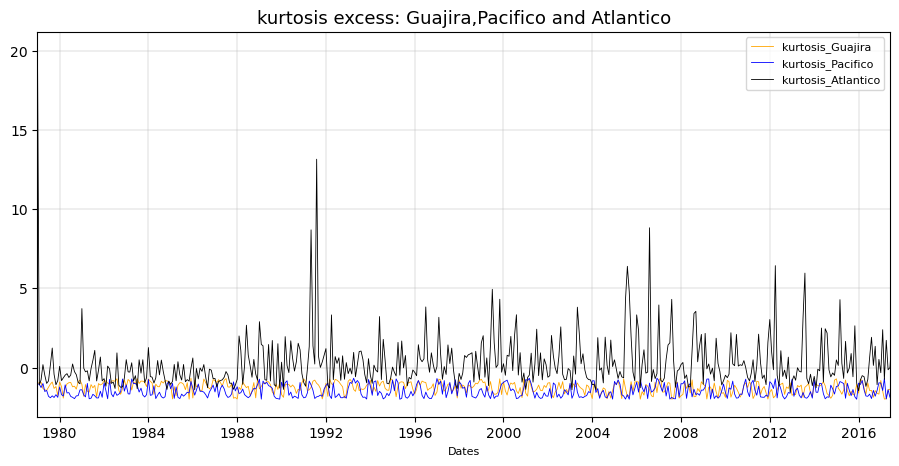

In [58]:
"Graficación kurtosis: Global,Guajira,Pacifico,Atlantico"
plt.figure(figsize=[11,5])
#plt.plot(fechas,kurt, 'red', label = 'kurtosis_Global',lw=0.6)
plt.title(u'kurtosis excess: Guajira,Pacifico and Atlantico', fontsize=13)
plt.plot(fechas,kurt_Guajira, color='orange', label = 'kurtosis_Guajira',lw=0.6)
plt.plot(fechas,kurt_Pacifico, color='blue', label = 'kurtosis_Pacifico',lw=0.6)         
plt.plot(fechas,kurt_Atlantico, color='k', label = 'kurtosis_Atlantico',lw=0.6)
plt.xlim([datetime.datetime(1979, 1, 1, 0, 0),datetime.datetime(2017, 6, 1, 0, 0)])
#plt.ylabel(u'Precipitación (mm/dia)', fontsize=8) # la kurtosis es adimensional
plt.xlabel('Dates', fontsize=8)
plt.legend(loc= "upper right",fontsize=8)
plt.grid(lw=0.3)
#%%


## Skewness aplicada a Guajira, Atlántico y Pacifico

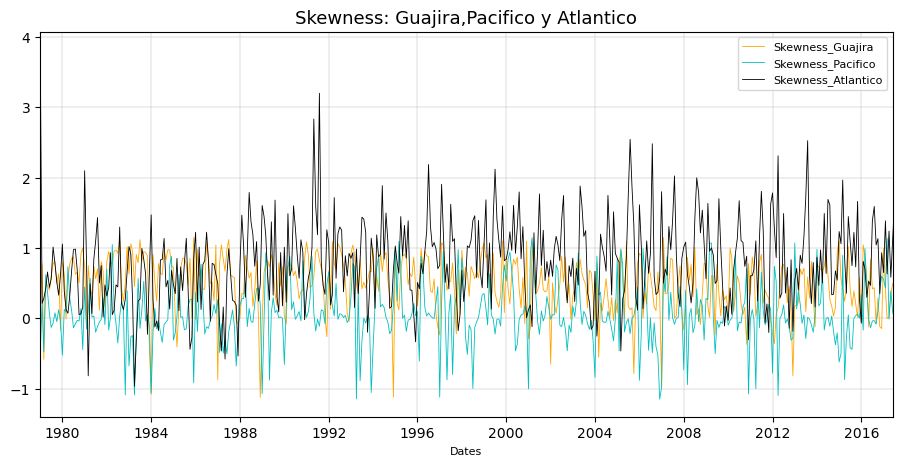

In [59]:
"Graficación Skewness: Global,Guajira,Pacifico,Atlantico"
plt.figure(figsize=[11,5])
#plt.plot(fechas,Skew, 'red', label = 'Skewness_Global',lw=0.6)
plt.title(u'Skewness: Guajira,Pacifico y Atlantico', fontsize=13)
plt.plot(fechas,Skew_Guajira, color='orange', label = 'Skewness_Guajira',lw=0.6)
plt.plot(fechas,Skew_Pacifico, color='c', label = 'Skewness_Pacifico',lw=0.6)         
plt.plot(fechas,Skew_Atlantico, color='k', label = 'Skewness_Atlantico',lw=0.6)
plt.xlim([datetime.datetime(1979, 1, 1, 0, 0),datetime.datetime(2017, 6, 1, 0, 0)])
#plt.ylabel(u'Precipitación (mm/dia)', fontsize=8)
plt.xlabel('Dates', fontsize=8)
plt.legend(loc= "upper right",fontsize=8)
plt.grid(lw=0.3)
#%%


## Percentil 25 y 75 aplicada a Guajira, Atlántico y Pacifico

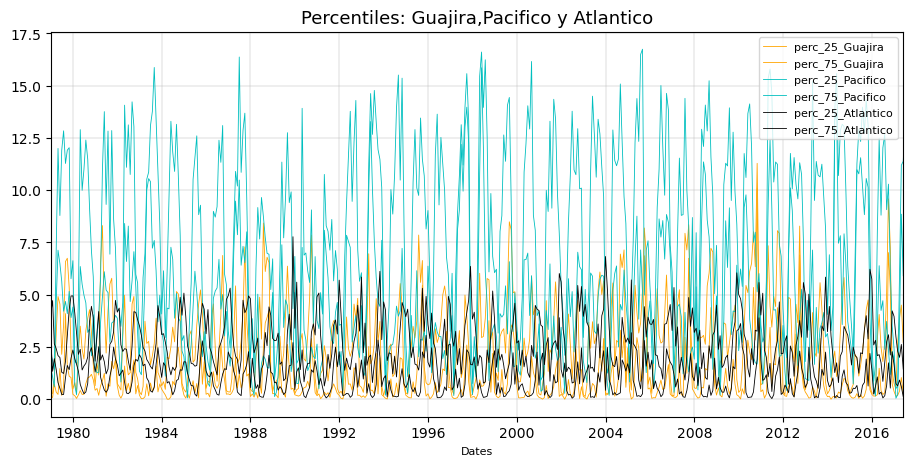

In [60]:
"Graficación percentiles : Global,Guajira,Pacifico,Atlantico"
plt.figure(figsize=[11,5])
#plt.plot(fechas,perc_25, 'red', label = 'perc_25_Global',lw=0.6)
#plt.plot(fechas,perc_75, 'red', label = 'perc_75_Global',lw=0.6)
plt.title(u'Percentiles: Guajira,Pacifico y Atlantico', fontsize=13)
plt.plot(fechas,perc_25_Guajira, color='orange', label = 'perc_25_Guajira',lw=0.6)
plt.plot(fechas,perc_75_Guajira, color='orange', label = 'perc_75_Guajira',lw=0.6)
plt.plot(fechas,perc_25_Pacifico, color='c', label = 'perc_25_Pacifico',lw=0.6)
plt.plot(fechas,perc_75_Pacifico, color='c', label = 'perc_75_Pacifico',lw=0.6)         
plt.plot(fechas,perc_25_Atlantico, color='k', label = 'perc_25_Atlantico',lw=0.6)
plt.plot(fechas,perc_75_Atlantico, color='k', label = 'perc_75_Atlantico',lw=0.6)
plt.xlim([datetime.datetime(1979, 1, 1, 0, 0),datetime.datetime(2017, 6, 1, 0, 0)])
#plt.ylabel(u'Precipitación (mm/dia)', fontsize=8)
#plt.ylim(0,18)
plt.xlabel('Dates', fontsize=8)
plt.legend(loc= "upper right",fontsize=8)
plt.grid(lw=0.3)

# HISTOGRAMAS BIVARIADOS

* El histograma bivariado muestra la **distribución conjunta de las dos variables**, por lo que estos patrones pueden ayudar a entender la **relación entre la precipitación en dos regiones simultaneamente**

* La barra de **colores indica la cantidad de datos en cada intervalo de clase** conjunto de ambas ubicaciones.  El histograma bivariado muestra de manera conjunta la distribución de las observaciones o datos de la variable precipitación en ambas regiones

Text(0, 0.5, 'Media_Atlantico')

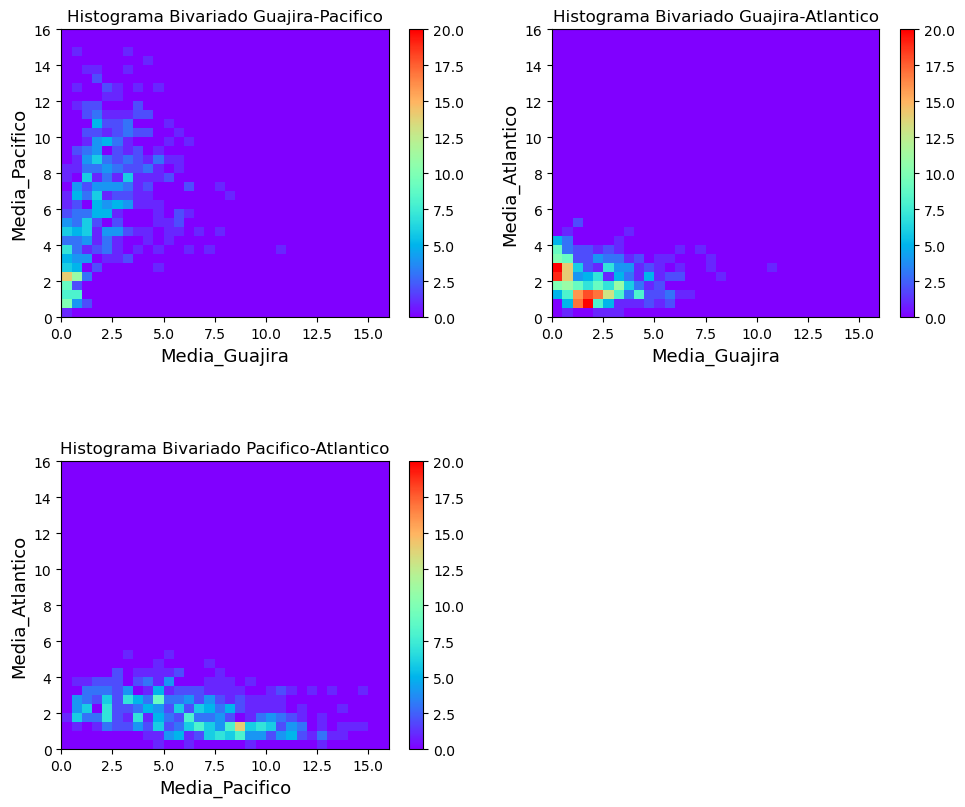

In [61]:

import scipy.stats as scp
fig=plt.figure(figsize=(10,8))

ax=fig.add_subplot(221)
plt.hist2d(Media_Guajira,Media_Pacifico,bins =(32,32),  range = [[0, 16], [0, 16]], cmap = 'rainbow', vmin=0,vmax=20)
plt.colorbar()
plt.subplots_adjust(0.1,0.1,1,1,0.2,0.5)
ax.set_title('Histograma Bivariado Guajira-Pacifico')
ax.set_xlabel('Media_Guajira', fontsize=13)
ax.set_ylabel('Media_Pacifico', fontsize=13)
#ax.axhline(0, color='k')
#ax.axvline(0, color='k')

ax=fig.add_subplot(222)
plt.hist2d(Media_Guajira,Media_Atlantico, bins =(32,32),  range = [[0, 16], [0, 16]], cmap = 'rainbow', vmin=0,vmax=20)
plt.colorbar()
ax.set_title('Histograma Bivariado Guajira-Atlantico')
ax.set_xlabel('Media_Guajira', fontsize=13)
ax.set_ylabel('Media_Atlantico', fontsize=13)
#ax.axhline(0, color='k')
#ax.axvline(0, color='k')

ax=fig.add_subplot(223)
plt.hist2d(Media_Pacifico,Media_Atlantico, bins =(32,32),  range = [[0, 16], [0, 16]], cmap = 'rainbow', vmin=0,vmax=20)
plt.colorbar()
ax.set_title('Histograma Bivariado Pacifico-Atlantico')
ax.set_xlabel('Media_Pacifico', fontsize=13)
ax.set_ylabel('Media_Atlantico', fontsize=13)
#ax.axhline(0, color='k')
#ax.axvline(0, color='k')

Si la barra de colores muestra valores más distribuidos en el rango de 0 a 16 mm/día para el océano Pacífico en comparación con la Guajira, esto indica que hay una mayor cantidad de observaciones o datos de precipitación en ese rango en el océano Pacífico en comparación con la Guajira

## Scatterplots de Guajira vs Pacifico, Guajira vs Atlantico y Pacifico vs Atlántico

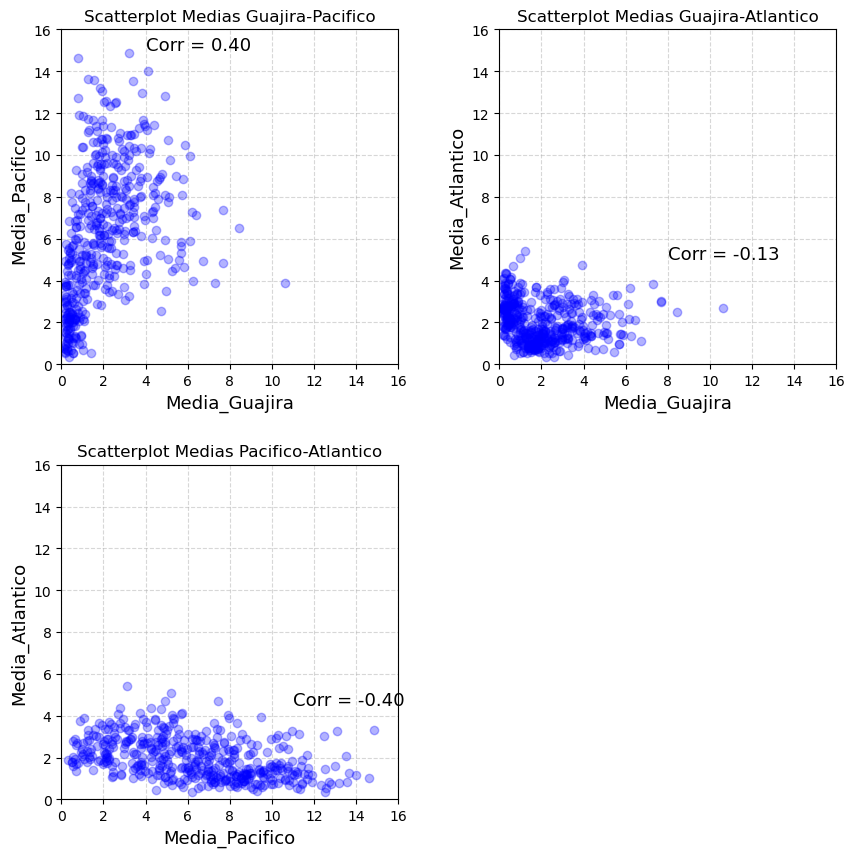

In [73]:
import scipy.stats as scp

# Cálculo de las correlaciones
corr_gp = scp.pearsonr(Media_Guajira, Media_Pacifico)
corr_ga = scp.pearsonr(Media_Guajira, Media_Atlantico)
corr_pa = scp.pearsonr(Media_Pacifico, Media_Atlantico)

# Configuración de la figura
fig, axes = plt.subplots(2, 2, figsize=[10, 10])
plt.subplots_adjust(wspace=0.3, hspace=0.3)

# Scatterplot Medias Guajira-Pacifico
axes[0, 0].set_title('Scatterplot Medias Guajira-Pacifico')
axes[0, 0].plot(Media_Guajira, Media_Pacifico, 'o', color='b', alpha=0.3)
axes[0, 0].set_xlabel('Media_Guajira', fontsize=13)
axes[0, 0].set_ylabel('Media_Pacifico', fontsize=13)
axes[0, 0].text(4, 15, f'Corr = {corr_gp[0]:.2f}', fontsize=13)
axes[0, 0].grid(linestyle='--', alpha=0.5)
axes[0, 0].set_xlim(0, 16)
axes[0, 0].set_ylim(0, 16)

# Scatterplot Medias Guajira-Atlantico
axes[0, 1].set_title('Scatterplot Medias Guajira-Atlantico')
axes[0, 1].plot(Media_Guajira, Media_Atlantico, 'o', color='b', alpha=0.3)
axes[0, 1].set_xlabel('Media_Guajira', fontsize=13)
axes[0, 1].set_ylabel('Media_Atlantico', fontsize=13)
axes[0, 1].text(8, 5, f'Corr = {corr_ga[0]:.2f}', fontsize=13)
axes[0, 1].grid(linestyle='--', alpha=0.5)
axes[0, 1].set_xlim(0, 16)
axes[0, 1].set_ylim(0, 16)

# Scatterplot Medias Pacifico-Atlantico
axes[1, 0].set_title('Scatterplot Medias Pacifico-Atlantico')
axes[1, 0].plot(Media_Pacifico, Media_Atlantico, 'o', color='b', alpha=0.3)
axes[1, 0].set_xlabel('Media_Pacifico', fontsize=13)
axes[1, 0].set_ylabel('Media_Atlantico', fontsize=13)
axes[1, 0].text(11, 4.5, f'Corr = {corr_pa[0]:.2f}', fontsize=13)
axes[1, 0].grid(linestyle='--', alpha=0.5)
axes[1, 0].set_xlim(0, 16)
axes[1, 0].set_ylim(0, 16)

# Eliminación del último subplot vacío
fig.delaxes(axes[1, 1])

plt.show()


C:\Users\jaech\AppData\Local\Temp\ipykernel_11096\3697415831.py:17: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  lista_vector=np.array(lista)


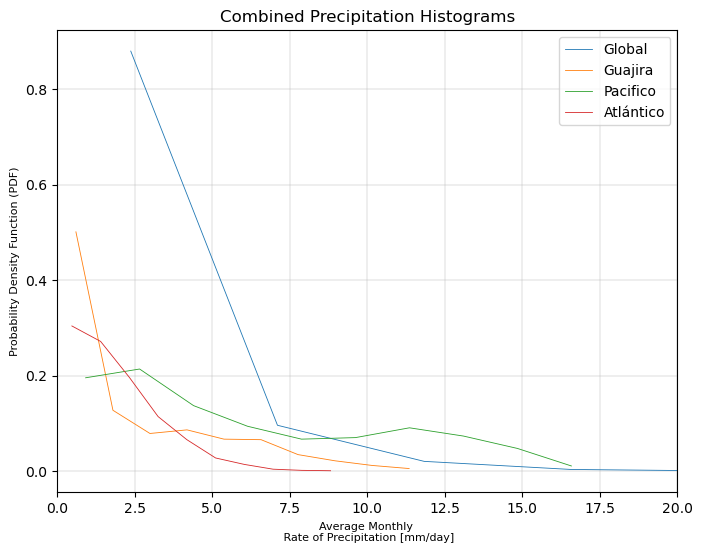

In [76]:
import matplotlib.pyplot as plt

# Definir las variables y los datos
Mapa1 = precipitacion[:,:,:]
Mapa1_NoNaN = Mapa1[np.isfinite(Mapa1)]

Mapa2 = precipitacion[:,Guajira_Lat,Guajira_Lon]
Mapa2_NoNaN_Guajira = Mapa2[np.isfinite(Mapa2)]

Mapa3 = precipitacion[:,Pacifico_Lat,Pacifico_Lon]
Mapa3_NoNaN_Pacifico = Mapa3[np.isfinite(Mapa3)]

Mapa4 = precipitacion[:,Atlantico_Lat,Atlantico_Lon]
Mapa4_NoNaN_Atlantico = Mapa4[np.isfinite(Mapa4)]

lista=[Mapa1_NoNaN,Mapa2_NoNaN_Guajira,Mapa3_NoNaN_Pacifico, Mapa4_NoNaN_Atlantico]
lista_vector=np.array(lista)
Zonas=['Global','Guajira','Pacifico','Atlántico']

Bins=10

# Configurar la figura
fig, ax = plt.subplots(figsize=(8, 6))

for i, (data, zona) in enumerate(zip(lista_vector, Zonas)):
    # Calcular el histograma
    nobs, bins = np.histogram(data, Bins)
    pdf = nobs / nobs.sum()
    bincenters = (bins[1:] + bins[:-1]) / 2

    # Graficar
    ax.plot(bincenters, pdf, linewidth=0.6, label=zona)

# Configurar leyenda, etiquetas y título
ax.legend(fontsize=10)
ax.set_ylabel(u'Probability Density Function (PDF)', fontsize=8)
ax.set_xlabel(u'Average Monthly \n Rate of Precipitation [mm/day]', fontsize=8)
ax.set_title('Combined Precipitation Histograms', fontsize=12)
ax.grid(lw=0.3)

# Establecer límites del eje x
ax.set_xlim(0, 20)

# Guardar la figura
plt.savefig(ruta_figuras + 'Combined_PDF_Colors_Limited.jpg', dpi=300)

# Mostrar la figura
plt.show()


In [77]:
Zonas = ['Global', 'Guajira', 'Pacifico', 'Atlántico']

perc_25_series = []
perc_75_series = []

for i in range(len(lista_vector)):
    perc_25_series.append(np.percentile(lista_vector[i], 25))
    perc_75_series.append(np.percentile(lista_vector[i], 75))

perc_25_series_vector = np.array(perc_25_series)
perc_75_series_vector = np.array(perc_75_series)

print(perc_25_series_vector.shape)
print(perc_75_series_vector.shape)

(4,)
(4,)


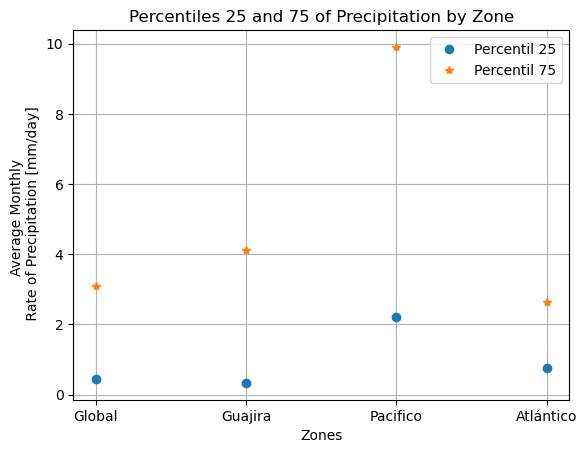

In [65]:
plt.plot(perc_25_series_vector, 'o', label='Percentil 25')
plt.plot(perc_75_series_vector, '*', label='Percentil 75')
plt.xticks(range(len(Zonas)), Zonas)
plt.xlabel('Zones')
plt.ylabel("Average Monthly \n Rate of Precipitation [mm/day]")
plt.title('Percentiles 25 and 75 of Precipitation by Zone')
plt.legend()
plt.grid(True)
plt.show()

### Funciones para filtrar valores atípicos

Estas funciones permiten filtrar outliers (datos atípicos), no fueron usadas en este código y parte de la tarea es usarlas con criterio de literatura, es decir dentro del contexto de los datos ¿cuál método y que umbral (threshold) utilizar?

In [66]:
# desviación estandar
def filter_outliers_std(arr, threshold):
    mean = np.mean(arr)
    std = np.std(arr)
    lower_bound = mean - threshold * std
    upper_bound = mean + threshold * std
    filtered_arr = np.where(np.logical_or(arr < lower_bound, arr > upper_bound), np.nan, arr)# crea un nuevo arreglo (filtered_arr) en el que los valores que cumplen la condición (outliers) se reemplazan por np.nan, mientras que los valores que no cumplen la condición se mantienen sin cambios.
    return filtered_arr


In [67]:
# rango intercuartil iqr
def filter_outliers_iqr(arr, threshold):
    q1 = np.percentile(arr, 25)
    q3 = np.percentile(arr, 75)
    iqr = q3 - q1
    lower_bound = q1 - threshold * iqr
    upper_bound = q3 + threshold * iqr
    filtered_arr = np.where(np.logical_or(arr < lower_bound, arr > upper_bound), np.nan, arr) # crea un nuevo arreglo (filtered_arr) en el que los valores que cumplen la condición (outliers) se reemplazan por np.nan, mientras que los valores que no cumplen la condición se mantienen sin cambios.
    return filtered_arr

In [68]:
filtered_arr = filter_outliers_std(precipitacion, 3)

In [69]:
print('la cantidad de datos válidos antes de filtrar outliers   son: ',len(precipitacion[np.isfinite(precipitacion)]))
print('la cantidad de datos válidos despues de filtrar outliers son: ',len(filtered_arr[np.isfinite(filtered_arr)]))
print('la cantidad de outliers encontrados son: ',len(precipitacion[np.isfinite(precipitacion)])-len(filtered_arr[np.isfinite(filtered_arr)]))

la cantidad de datos válidos antes de filtrar outliers   son:  4800384
la cantidad de datos válidos despues de filtrar outliers son:  4695364
la cantidad de outliers encontrados son:  105020


In [70]:
print(filtered_arr.shape)
print(precipitacion.shape)

(463, 72, 144)
(463, 72, 144)
